# Housing : Price Prediction

Problem Statement:
  
     Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

    A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

    The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:
    
   1) Which variables are important to predict the price of variable?

   2) How do these variables describe the price of the house?

# Business Goal:

    You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

# Importing necessary libraries

In [1]:
# preprocessing
import numpy as np
import pandas as pd

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

import os
import scipy as stats

import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
# reading train.csv file
train_df = pd.read_csv(r'C:\Users\Praveen kumar\Downloads\Project-Housing--2---1---1-\Project-Housing_splitted\train.csv')
train_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500


In [3]:
# reading test.csv file
test_df = pd.read_csv(r'C:\Users\Praveen kumar\Downloads\Project-Housing--2---1---1-\Project-Housing_splitted\test.csv')
test_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,...,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal


Here we are provided with train and test datasets. Both the dataset provides information about the House. The datasets contains both numerical and categorical data types. And we can notice missing values in some of the columns.

1)The train dataset is comparised of both dependent variable (target) and independent variables. Here "SalesPrice" is our label which is continuous in nature so, it is a "Regression Type Problem" where I need to predict the sales price of the house.

2)The test dataset contains only independent variables.
 
So, I will use train dataset for building our model and then will use the test dataset for getting prediction from the trained model.

# Preprocessing and Exploratory Data Analysis (EDA)

In [4]:
# checking the dimensions of both train and test dataset
print("Shape of train dataset is: ",train_df.shape)
print("Shape of test dataset is: ",test_df.shape)

Shape of train dataset is:  (1168, 81)
Shape of test dataset is:  (292, 80)


Observation:

    1)The train dataset contains 1168 rows and 81 columns. Out of 81 columns 80 are independent variables and remaining one is our target variable.
    
    2)The test dataset contains 292 rows and 80 columns. This test dataset contains only independent variables and there is no label.

In [5]:
# checking the column names in the train and test dataset
print("Columns present in train dataset:\n",train_df.columns)
print("\n")
print("Columns present in test dataset:\n",test_df.columns)

Columns present in train dataset:
 Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual

In [6]:
# checking the type of train dataset
train_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [7]:
# checking the type of test dataset
test_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MiscVal            int64
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
Length: 80, dtype: object

In [8]:
# to get good overview of the train dataset
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [9]:
# to get good overview of the test dataset
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

# Feature Engineering

In [10]:
# checking number of unique values in each column of train dataset
train_df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,1168
MSSubClass,15
MSZoning,5
LotFrontage,106
LotArea,892
...,...
MoSold,12
YrSold,5
SaleType,9
SaleCondition,6


Above are the number of unique values present in the columns of the train dataset.

# Dropping irrelevant columns

1)From the nunique() method I can notice the column "Id" is the unique Id number given to the house and it has no significance in the prediction so let's drop it.

2)Also the column "Utilities" has only one unique value Allpub(All public Utilities) throughout the column, so it can be dropped as it won't affect the model.

In [11]:
train_df.drop("Id",axis=1,inplace=True)
train_df.drop("Utilities",axis=1,inplace=True)

In [12]:
# checking number of unique values in each column of test dataset
test_df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
...,...
MiscVal,8
MoSold,12
YrSold,5
SaleType,6


In [13]:
test_df.drop("Id",axis=1,inplace=True)
test_df.drop("Utilities",axis=1,inplace=True)

# Value count function

Let's check the list of value counts in each columns to find if there are any unexpected or corrupted entries present in the dataset.

In [14]:
# checking the value counts of each columns of train dataset
for i in train_df.columns:
    print(train_df[i].value_counts())
    print('*'*100)

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
        ... 
102.0      1
144.0      1
112.0      1
149.0      1
153.0      1
Name: LotFrontage, Length: 106, dtype: int64
****************************************************************************************************
9600     21
7200     18
6000     16
8400     14
9000     11
         ..
12803     1
9480      1
13478     1
12122     1
7861      1
Name: LotArea, Length: 892, dtype: int64
************************************

Obseravations:
    
    1)From the value count function I can observe most of the columns contains maximum amount of zero values which is even not required for the prediction.
    
    2)The columns 'LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'and 'BsmtFinSF2' have more than 90% zero values. So I am going to drop these columns.
    
    3)Also some of the columns like BsmtFinSF, BsmtHalfBath, etc have large amount of zero values. Since I am assuming, the houses which have no basements could be calculated as zero square feet. So, I am keeping those columns as it is.

# Dealing with zero values for train_df

In [15]:
Zero_value = pd.DataFrame(train_df.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns=['Count of Zero values']
Zero_value['% of Zero values']=Zero_value['Count of Zero values']/11.68    # 1168/100 = 11.68
Zero_value

,Count of Zero values,% of Zero values
PoolArea,1161,99.400685
3SsnPorch,1146,98.116438
LowQualFinSF,1145,98.030822
MiscVal,1126,96.404110
BsmtHalfBath,1105,94.606164
...,...,...
ExterQual,0,0.000000
MasVnrType,0,0.000000
Exterior2nd,0,0.000000
Exterior1st,0,0.000000


In [16]:
# dropping the columns containing maximum amount (90%) of zero values
train_df.drop(columns = ['LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','BsmtFinSF2'],inplace = True)

In [17]:
# checking the value counts of each columns of test dataset
for i in test_df.columns:
    print(test_df[i].value_counts())
    print('*'*100)

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
180      4
190      4
45       2
75       2
85       1
40       1
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0    32
85.0    14
50.0    13
70.0    12
21.0     9
        ..
77.0     1
71.0     1
59.0     1
36.0     1
69.0     1
Name: LotFrontage, Length: 65, dtype: int64
****************************************************************************************************
7200     7
1680     4
5400     3
8450     3
9600     3
        ..
8280     1
9735     1
6979     1
12822    1
1953     1
Name: LotArea, Length: 249, dtype: int64
*************************************************************************************

# Dealing with zero values for test_df

In [18]:
Zero_value = pd.DataFrame(test_df.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns=['Count of Zero values']
Zero_value['% of Zero values']=Zero_value['Count of Zero values']/2.92       # 292/100 = 2.92
Zero_value

,Count of Zero values,% of Zero values
PoolArea,292,100.000000
3SsnPorch,290,99.315068
LowQualFinSF,289,98.972603
MiscVal,282,96.575342
BsmtHalfBath,273,93.493151
...,...,...
ExterQual,0,0.000000
MasVnrType,0,0.000000
Exterior2nd,0,0.000000
Exterior1st,0,0.000000


In [19]:
# dropping the columns containing maximum amount (90%) of zero values
test_df.drop(columns = ['LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','BsmtFinSF2'],inplace = True)

# Dealing with Time variables in train dataset

In [20]:
# Let's subtract built year by year sold in order to get the age
train_df["AgeBuilt"] = train_df.YrSold - train_df.YearBuilt
train_df["AgeRemod"] = train_df.YrSold - train_df.YearRemodAdd
train_df["AgeGarage"] = train_df.YrSold - train_df.GarageYrBlt
# dropping YearBuilt, YearRemodAdd and GarageYrBlt as I have already got the required value from it.
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YearRemodAdd",axis=1,inplace=True)
train_df.drop("GarageYrBlt",axis=1,inplace=True)

In [21]:
train_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,31,31,30.0
1,37,37,37.0
2,11,10,10.0
3,33,33,33.0
4,32,9,32.0


# Dealing with Time variables in test dataset

In [22]:
# let's subtract built year by year sold in order to get the age
test_df["AgeBuilt"] = test_df.YrSold - test_df.YearBuilt
test_df["AgeRemod"] = test_df.YrSold - test_df.YearRemodAdd
test_df["AgeGarage"] = test_df.YrSold - test_df.GarageYrBlt
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as I have already got the required value from it.
test_df.drop("YearBuilt",axis=1,inplace=True)
test_df.drop("YearRemodAdd",axis=1,inplace=True)
test_df.drop("GarageYrBlt",axis=1,inplace=True)

In [23]:
test_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,2,1,2.0
1,25,25,25.0
2,8,8,8.0
3,68,59,68.0
4,1,1,1.0


In [24]:
# checking the skewness in the train dataset
train_df.skew()

MSSubClass       1.422019
LotFrontage      2.450241
LotArea         10.659285
OverallQual      0.175082
OverallCond      0.580714
MasVnrArea       2.826173
BsmtFinSF1       1.871606
BsmtUnfSF        0.909057
TotalBsmtSF      1.744591
1stFlrSF         1.513707
2ndFlrSF         0.823479
GrLivArea        1.449952
BsmtFullBath     0.627106
BsmtHalfBath     4.264403
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.644657
Fireplaces       0.671966
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       1.504929
OpenPorchSF      2.410840
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
AgeBuilt         0.573127
AgeRemod         0.495051
AgeGarage        0.635240
dtype: float64

# Checking Null Values in train dataset

In [25]:
train_null = pd.DataFrame(train_df[train_df.columns[train_df.isnull().any()]].isnull().sum())
train_null.columns=['Count of Null Values']
train_null['% of Null Values']=train_null['Count of Null Values']/11.68    # 1168/100 = 11.68
train_null

,Count of Null Values,% of Null Values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


# Visualizations:

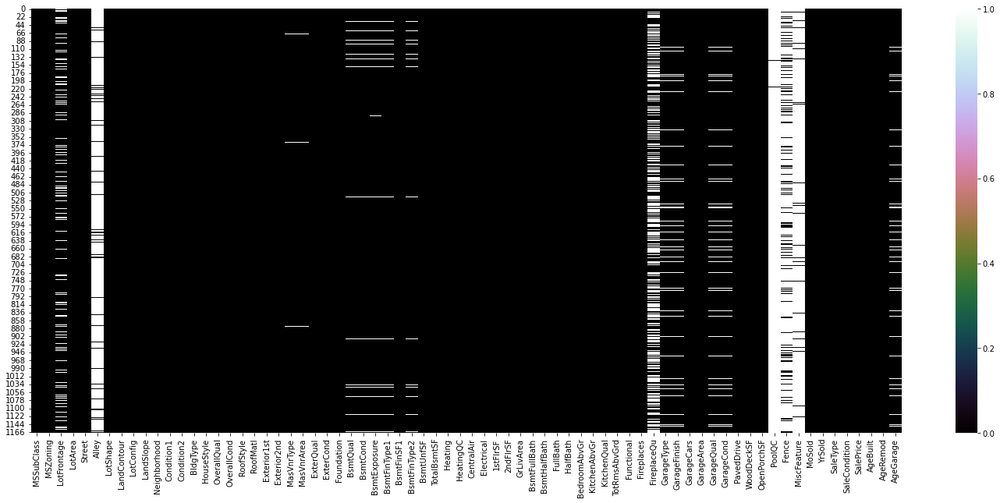

In [26]:
# let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(train_df.isnull(), cmap="cubehelix")
plt.show()

In [27]:
# dropping the columns containing more than 70% of the null values
train_df.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

# Treating null values using imputation techniques

In [28]:
# filling null values of object data column with their mode values (most frequently occurred values)

col1=train_df.columns.values
for i in range(0,len(col1)):
    if train_df[col1[i]].dtype == "object":
        train_df[col1[i]].fillna(train_df[col1[i]].mode()[0], inplace=True)

In [29]:
# filling null values of numerical columns with their mean values

col2=train_df.columns.values
for i in range(0,len(col2)):
    if train_df[col2[i]].dtype != "object":
        train_df[col2[i]].fillna(train_df[col2[i]].mean(), inplace=True)

In [30]:
train_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
SaleCondition    0
SalePrice        0
AgeBuilt         0
AgeRemod         0
AgeGarage        0
Length: 68, dtype: int64

I have filled all the null values using mean and mode method. Let's visualize it using heat map.

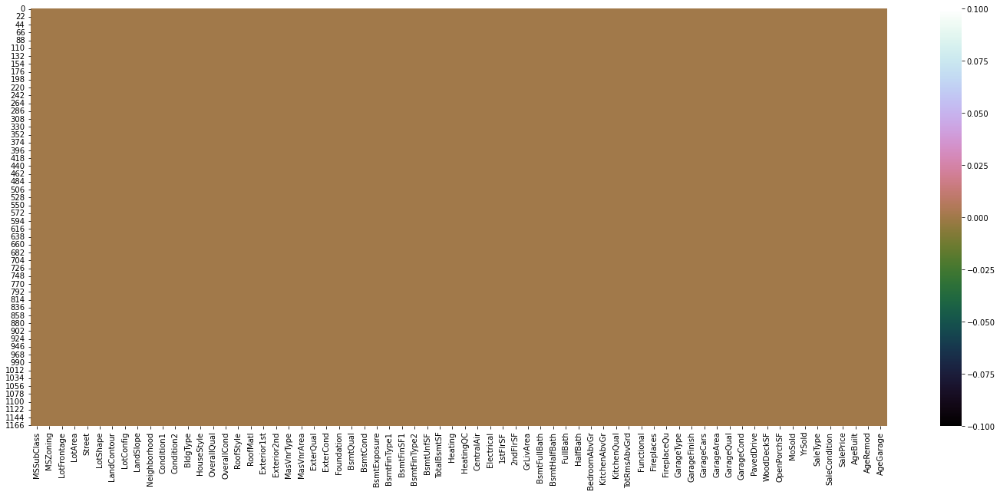

In [31]:
# let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(train_df.isnull(), cmap="cubehelix")
plt.show()

It is clear from the heat map that there are no null values in any of the column.

# Checking Null Values in test dataset

In [32]:
# displaying the columns containing null values count and their % i.e. ((count of null)/292)/100
test_null = pd.DataFrame(test_df[test_df.columns[test_df.isnull().any()]].isnull().sum())
test_null.columns=['Count of Null Values']
test_null['% of Null Values']=test_null['Count of Null Values']/2.92     # 292/100 = 2.92
test_null

,Count of Null Values,% of Null Values
LotFrontage,45,15.410959
Alley,278,95.205479
MasVnrType,1,0.342466
MasVnrArea,1,0.342466
BsmtQual,7,2.397260
BsmtCond,7,2.397260
BsmtExposure,7,2.397260
BsmtFinType1,7,2.397260
BsmtFinType2,7,2.397260
Electrical,1,0.342466


Observation: Similar to train data, the columns PoolQC, MiscFeature, Allery and Fence have null values more than 70% filling them with imputation methods is meaningless. So, let me drop them as they have no importance in the prediction.

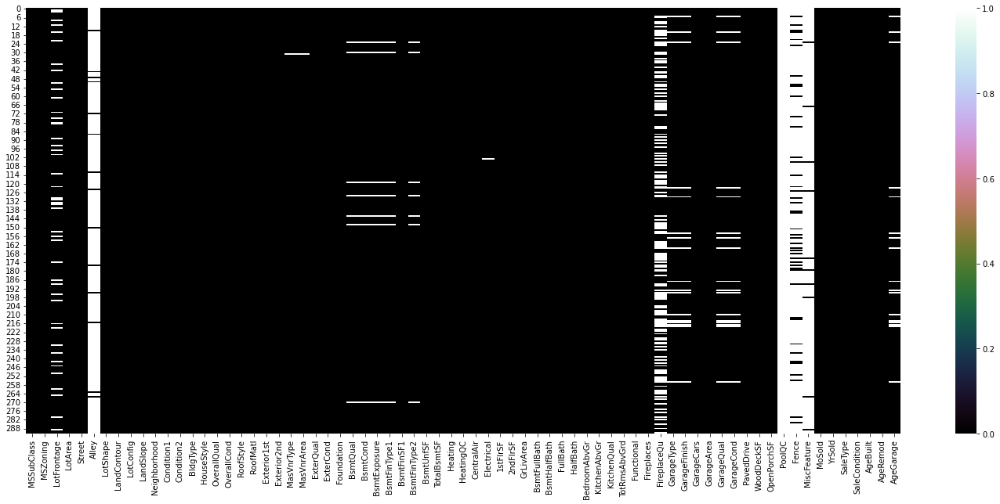

In [33]:
# let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(test_df.isnull(), cmap="cubehelix")
plt.show()

The white line shows the missing values in the dataset.

# Treating Null Values using imputation techniques

In [34]:
# Filling null values of object data column with their mode values (most frequently occurred values).

cols1=test_df.columns.values
for i in range(0,len(cols1)):
    if test_df[cols1[i]].dtype == "object":
        test_df[cols1[i]].fillna(test_df[cols1[i]].mode()[0], inplace=True)

In [35]:
# Filling null values of numerical columns with their mean values.

cols2=test_df.columns.values
for i in range(0,len(cols2)):
    if test_df[cols2[i]].dtype != "object":
        test_df[cols2[i]].fillna(test_df[cols2[i]].mode(), inplace=True)

In [36]:
test_df.isnull().sum()

MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
Street            0
                 ..
SaleType          0
SaleCondition     0
AgeBuilt          0
AgeRemod          0
AgeGarage        17
Length: 71, dtype: int64

I have filled all the values using mean and mode method. Hence there are no null values in any of the column. Let's visualize it using heat map.

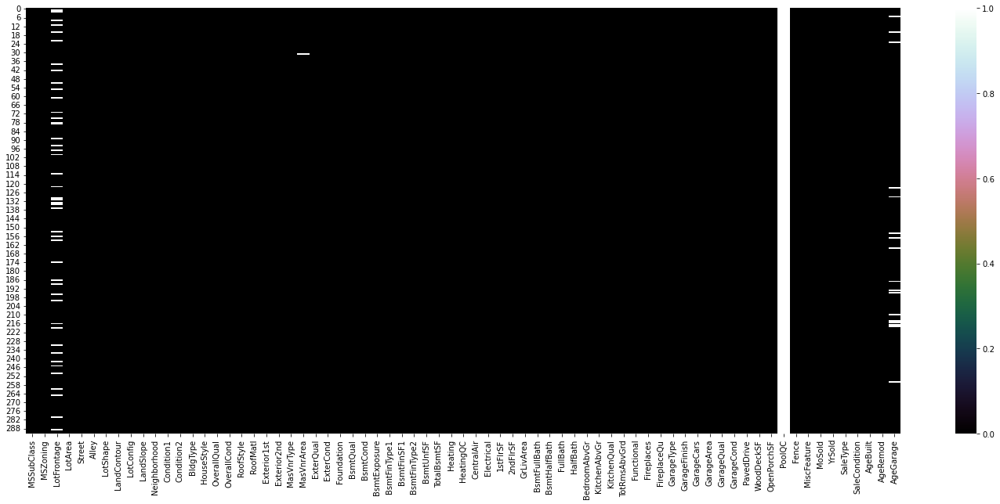

In [37]:
# let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(test_df.isnull(), cmap="cubehelix")
plt.show()

In [38]:
# checking the uniqueness of target column
train_df["SalePrice"].unique()

array([128000, 268000, 269790, 190000, 215000, 219210, 121500, 155000,
       140000, 118500, 119500, 237000, 201000, 126500, 135500, 165000,
       120500, 194500, 148000, 106000, 231500, 133000, 142125, 136500,
       146000, 217000, 112000, 394432, 113000, 188700, 319900, 135000,
       128500, 169000, 122000, 152000, 243000, 156000,  79500, 132000,
       144152, 130000, 149900, 124500, 179000, 147000,  39300, 312500,
       256000,  60000, 153000,  84900, 230000, 180000, 106500, 239000,
       107500, 123000, 176000, 228500, 117500, 350000, 200624, 173000,
       225000,  84500, 174900,  79000, 297000,  87000, 465000, 204900,
       127000, 159000, 170000, 159500, 102000, 109500, 163990, 189950,
       119000, 157500, 287000, 144000, 286000, 172000, 212000, 124000,
       150000, 205950, 251000, 129000, 223500, 475000, 335000, 115000,
       205000, 209500, 176432, 171000, 302000, 259500, 141000, 187500,
       385000, 275000, 108000,  89500, 109900, 185000, 143000, 127500,
      

In [39]:
# dropping the columns containing more than 70% of the null values
test_df.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

In [40]:
# checking the dimensions of both train and test dataset
print("Shape of train datast is: ",train_df.shape)
print("Shape of test dataset is: ",test_df.shape)

Shape of train datast is:  (1168, 68)
Shape of test dataset is:  (292, 67)


# Separating Numerical and categorical columns.

In [41]:
# separating numerical and categorical columns from train dataset

# checking for categorical columns
categorical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]=='object':
        categorical_coltr.append(i)
print("Categorical columns in train dataset are:\n",categorical_coltr)
print("\n")

# now checking for numerical columns
numerical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]!='object':
        numerical_coltr.append(i)
print("Numerical columns in train dataset are:\n",numerical_coltr)

Categorical columns in train dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in train dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice', 'AgeBuilt', 'AgeRe

In [42]:
# separating numerical and categorical columns from test dataset

# checking for categorical columns
categorical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]=='object':
        categorical_colte.append(i)
print("Categorical columns in test dataset are:\n",categorical_colte)
print("\n")

# now checking for numerical columns
numerical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]!='object':
        numerical_colte.append(i)
print("Numerical columns in test dataset are:\n",numerical_colte)

Categorical columns in test dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in test dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemod', 'AgeGarag

# Description of Train Dataset

In [43]:
# statistical summary of dataset
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice,AgeBuilt,AgeRemod,AgeGarage
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,...,1.776541,476.860445,96.206336,46.559932,6.344178,2007.804795,181477.005993,36.874144,23.046233,29.608696
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,...,0.745554,214.466769,126.158988,66.381023,2.686352,1.329738,79105.586863,30.193130,20.783486,24.247703
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,-1.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,...,1.000000,338.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000,8.000000,4.000000,7.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,...,2.000000,480.000000,0.000000,24.000000,6.000000,2008.000000,163995.000000,36.000000,14.000000,29.608696
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,...,2.000000,576.000000,171.000000,70.000000,8.000000,2009.000000,215000.000000,54.000000,42.000000,46.250000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,...,4.000000,1418.000000,857.000000,547.000000,12.000000,2010.000000,755000.000000,135.000000,60.000000,107.000000


# Description of Test Dataset

In [44]:
# statistical summary of dataset
test_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,AgeBuilt,AgeRemod,AgeGarage
count,292.000000,247.000000,292.000000,292.000000,292.000000,291.000000,292.000000,292.000000,292.000000,292.000000,...,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,275.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,...,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,2007.859589,35.243151,22.565068,28.090909
std,43.780649,21.726343,13330.669795,1.356147,1.063267,175.030021,429.559675,411.043768,424.561153,366.941919,...,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,1.322867,30.494309,20.089470,23.852399
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,0.000000
25%,20.000000,53.500000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,...,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,2007.000000,6.750000,4.000000,6.000000
50%,50.000000,65.000000,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,...,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,2008.000000,32.000000,14.000000,29.000000
75%,70.000000,79.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,...,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,2009.000000,53.250000,39.250000,43.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,...,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,2010.000000,136.000000,60.000000,90.000000


# Data Visualization

# Univariate Analysis

Plotting Categorical columns

Pie plots

Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


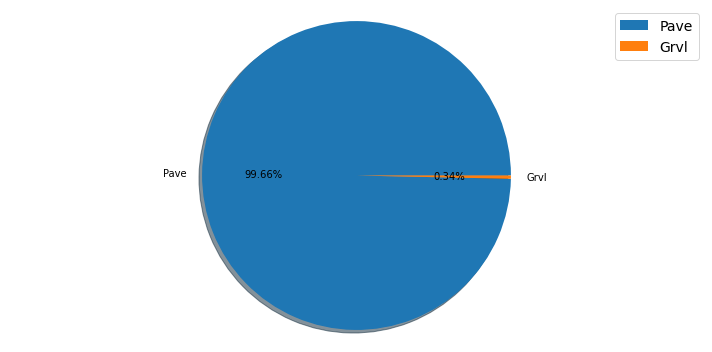

*****************************************************************************************************************************
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


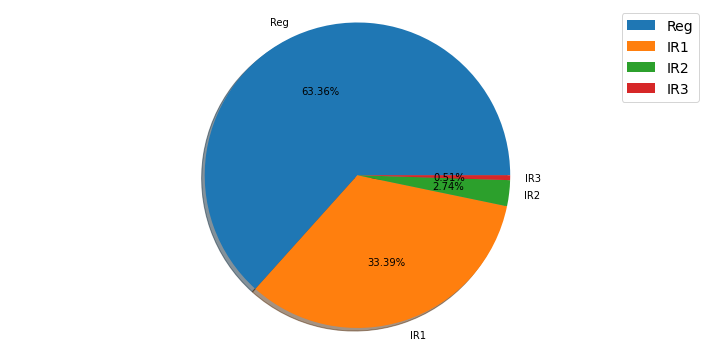

*****************************************************************************************************************************
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


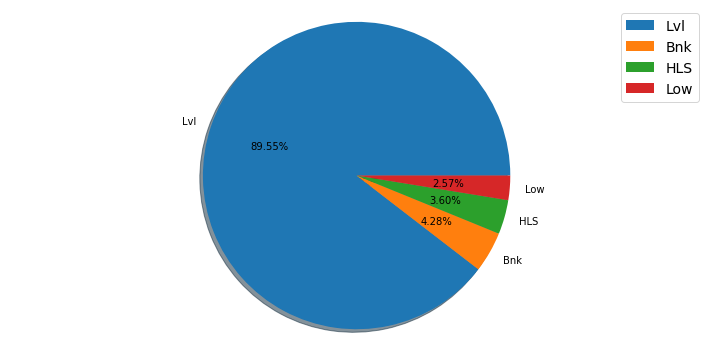

*****************************************************************************************************************************
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


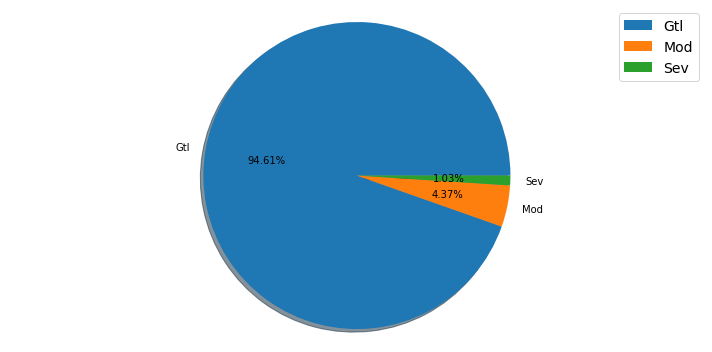

*****************************************************************************************************************************
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


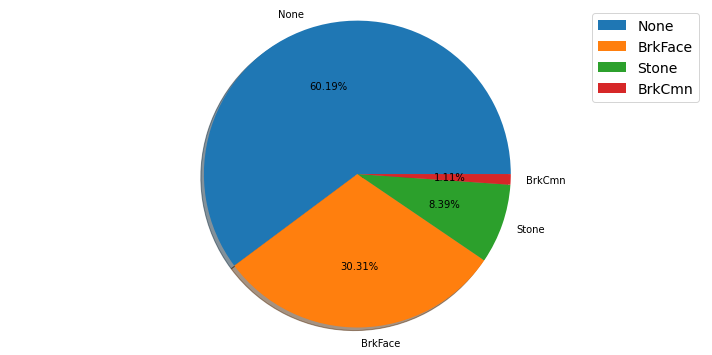

*****************************************************************************************************************************
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


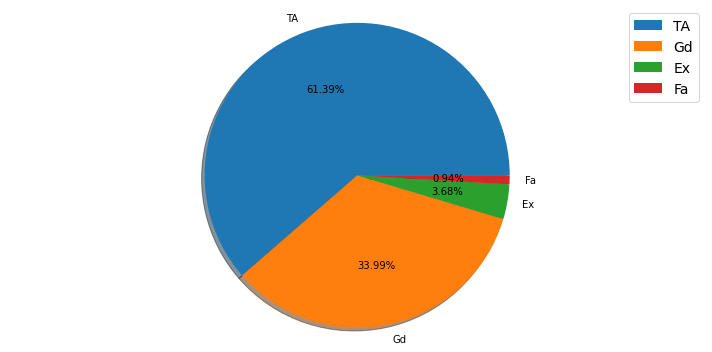

*****************************************************************************************************************************
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


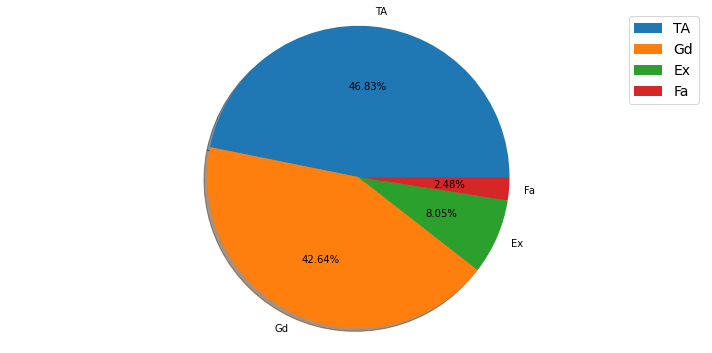

*****************************************************************************************************************************
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


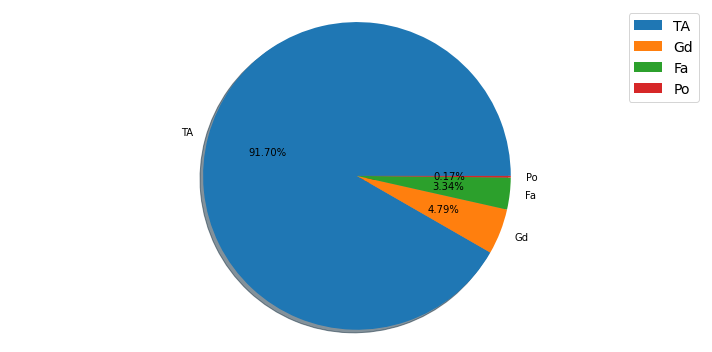

*****************************************************************************************************************************
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


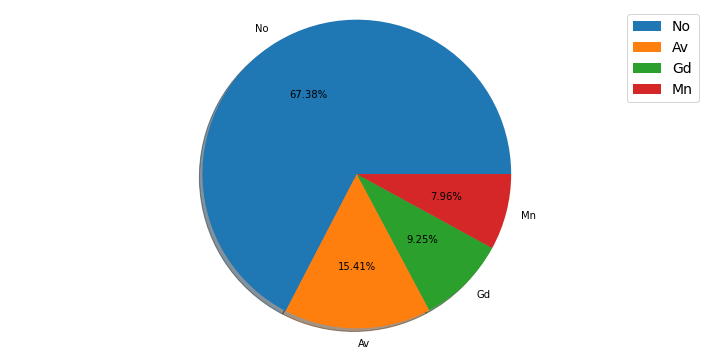

*****************************************************************************************************************************
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


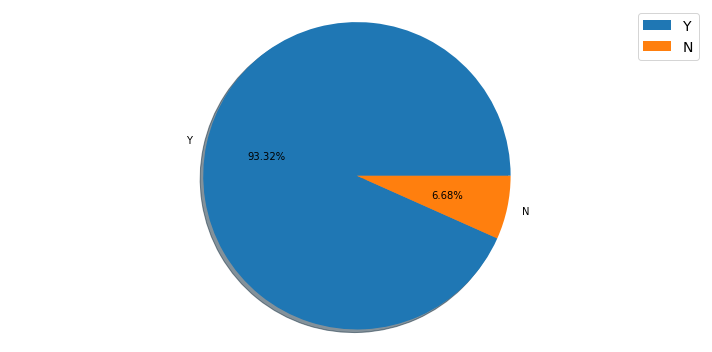

*****************************************************************************************************************************
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


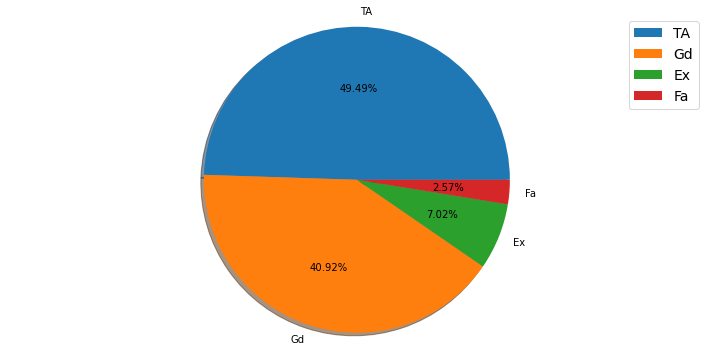

*****************************************************************************************************************************
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


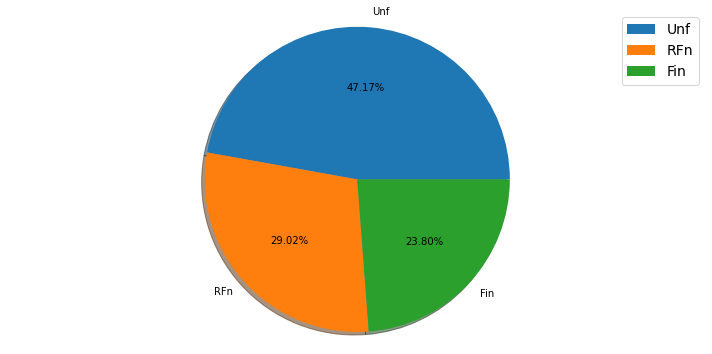

*****************************************************************************************************************************
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


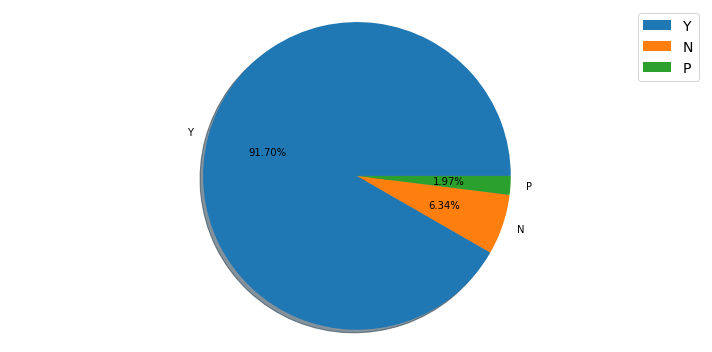

*****************************************************************************************************************************


In [45]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['Street', 'LotShape', 'LandContour', 'LandSlope', 'MasVnrType', 'ExterQual', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'CentralAir', 'KitchenQual', 'GarageFinish', 'PavedDrive']

plotnumber=1
for j in train_df[cols1]:
    print(f"Pie plot for the column:", j)
    print(train_df[j].value_counts())
    generate_pie(train_df[j])
    print("*"*125)

Observation :

Street: The count of road access to the property Paved is 1164 which covers around 99.66% of the property where Graved type has count 4 that is only 0.34%.

LotShape: The count is high for the property having the shape regular followed by slightly regular and the count is less for irregular and th ecount is less for irregular shape of property.

LandContour: The total number of flatness of the property for level is high which has 89.55% and the others like banked, hilside and depression have very less flatness of area.

LandSlope: The slope of the property Gentle slope has very high count of 1105 i.e. 94.61% and other types Moderate Slope and Severe Slope have very less count.

MasVnrType: Arount 60% of the houses does not have Masonry veneer type, 30% of the houses contains Brick Face type of Masonry veneer.

ExterQual: Around 61% of the houses evaluates typical/average quality of the material on the exterior, 34% of the houses have good quality of the material on the exterior. Only few have excellent quality.

BsmtQual: Most of the houses evaluates typical/average and good quality of height of the basement, only few of the houses have excellent quality.

BsmtCond: Around 91% of the houses have typical/average condition of the basement and only 2 houses have poor condition.

BsmtExposure: Around 67% of the houses does not contain any walkout or garden level walls and 7% of the houses have minimum exposure.

CentralAir: 93.32% of the houses have central air conditioning and only 6.68% of houses do not have air conditioning.

KitchenQual: 49% of the houses contains typical/average kitchen quality and 40% of the houses have good kitchen quality. The count for excellent kitchen quality is very low and is around 2%.

GarageFinish: 47% of the houses have unfinished garage interior, 29% rough finished and only 23% of the houses interior garage has finished.

PavedDrive: 91.70% of the houses contains the paved drive way.

# Count Plots

In [46]:
#Let's visualize the remaining nominal data.
def value_count(column):
    counts=len(train_df[column].value_counts())
    if counts<3:
        plt.figure(figsize=(8,5))
    elif counts<5:
        plt.figure(figsize=(8,5))
        plt.xticks(rotation=90)
    elif counts<10:
        plt.figure(figsize=(10,6))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=train_df,palette="Dark2")
    plt.show()
    print("*"*125)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


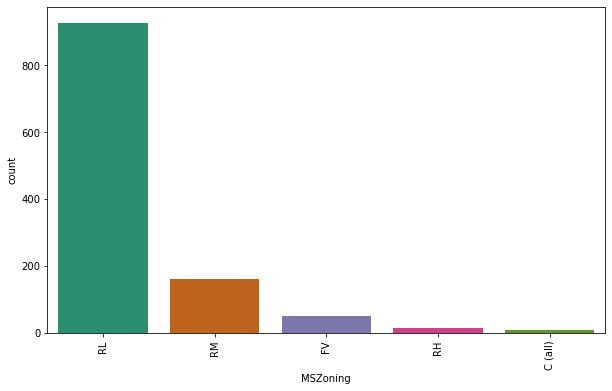

*****************************************************************************************************************************
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


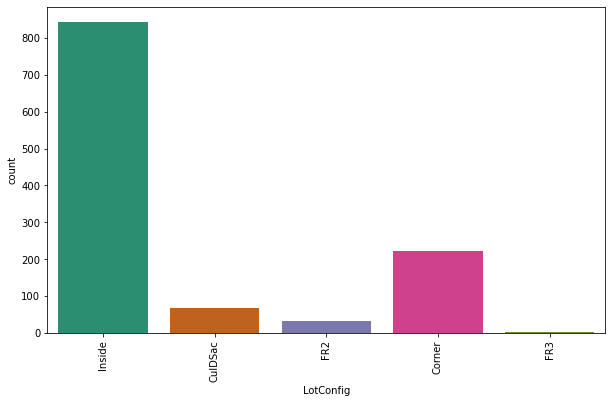

*****************************************************************************************************************************
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


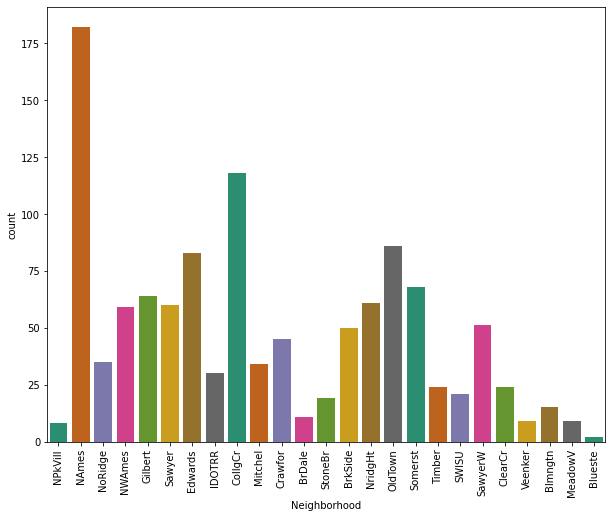

*****************************************************************************************************************************
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


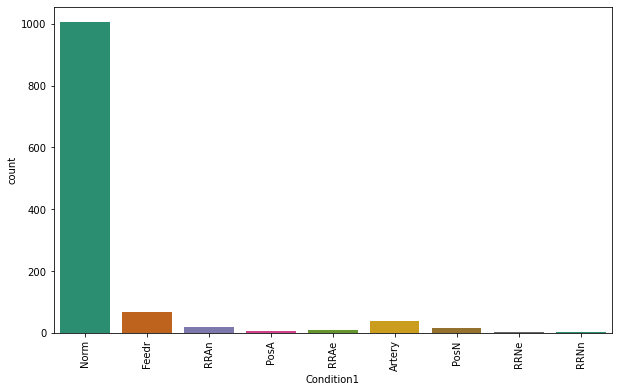

*****************************************************************************************************************************
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


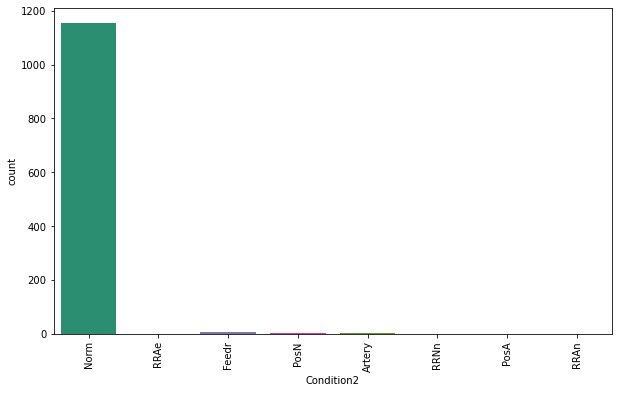

*****************************************************************************************************************************
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


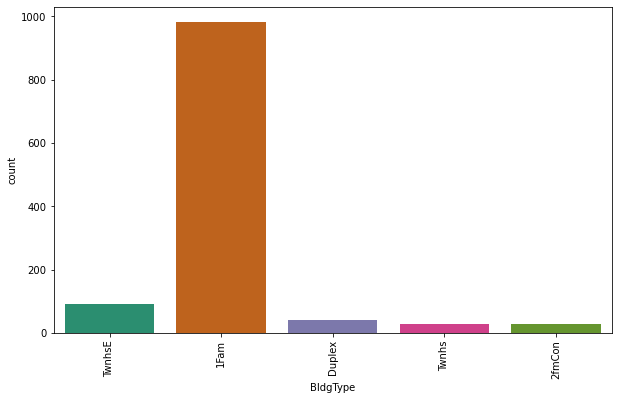

*****************************************************************************************************************************
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


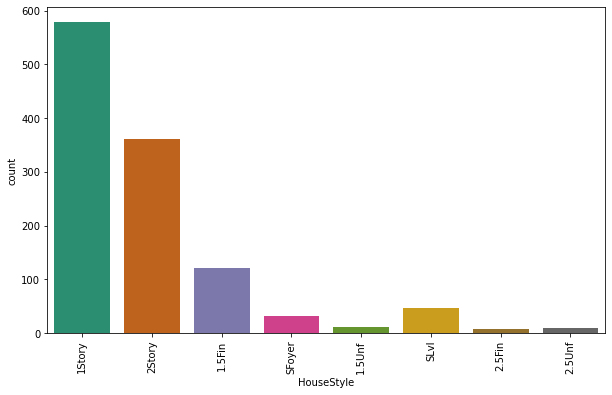

*****************************************************************************************************************************
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


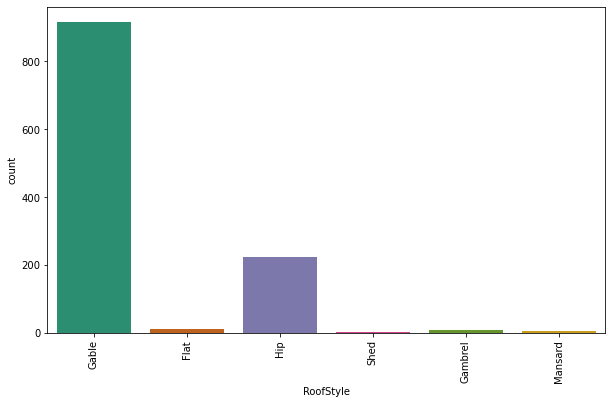

*****************************************************************************************************************************
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


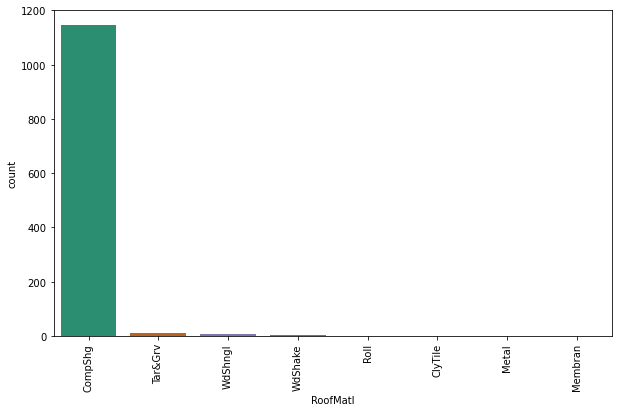

*****************************************************************************************************************************
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


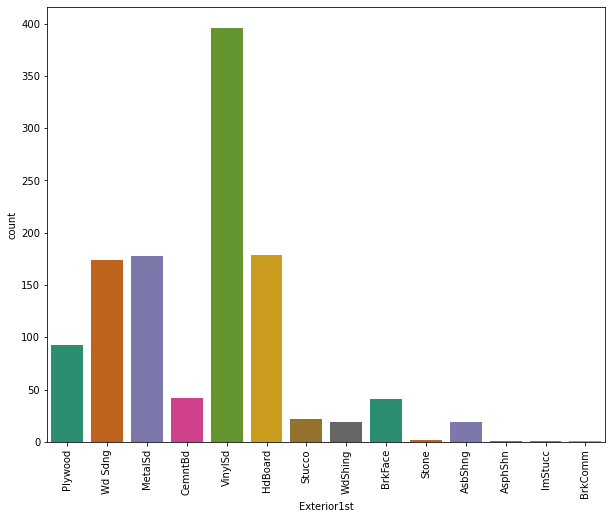

*****************************************************************************************************************************
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


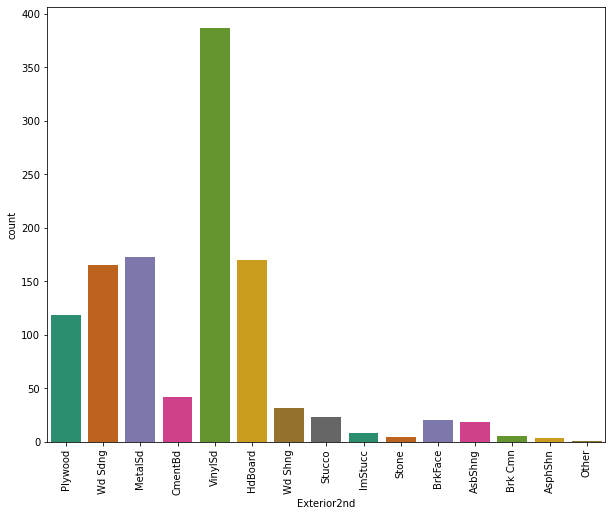

*****************************************************************************************************************************
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


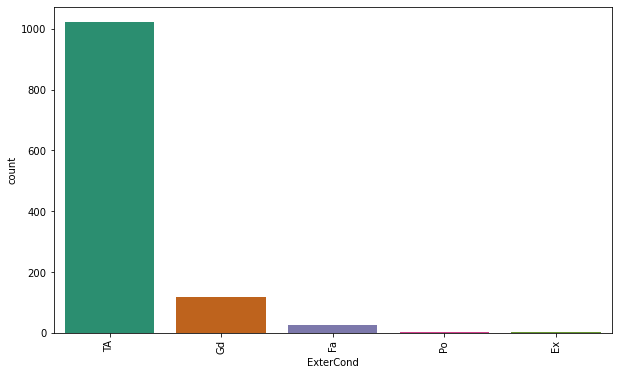

*****************************************************************************************************************************
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


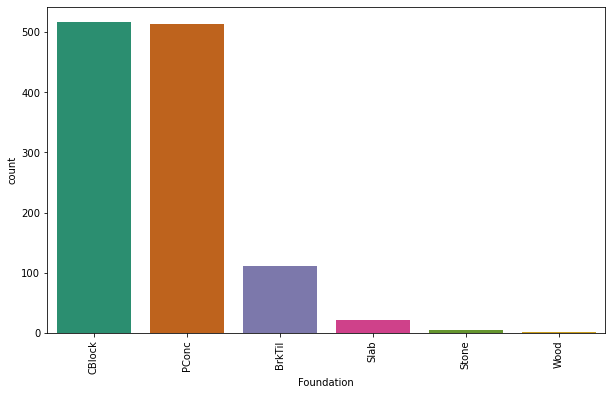

*****************************************************************************************************************************
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


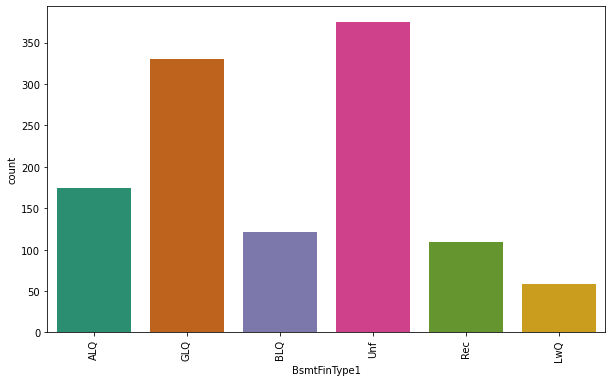

*****************************************************************************************************************************
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


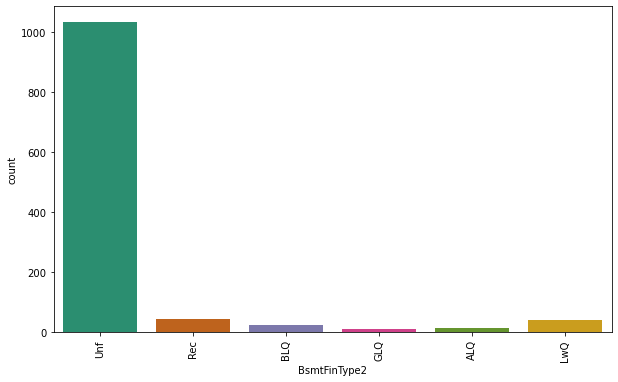

*****************************************************************************************************************************
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


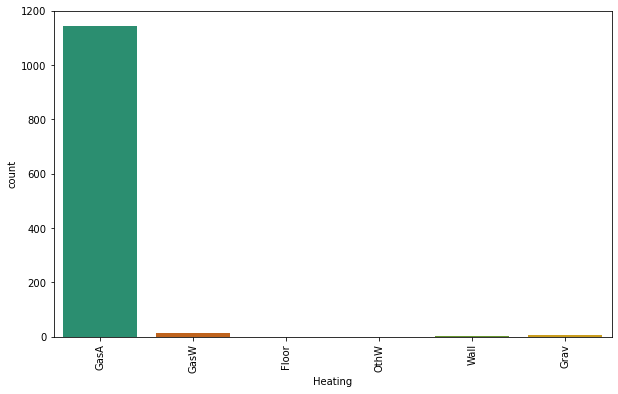

*****************************************************************************************************************************
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


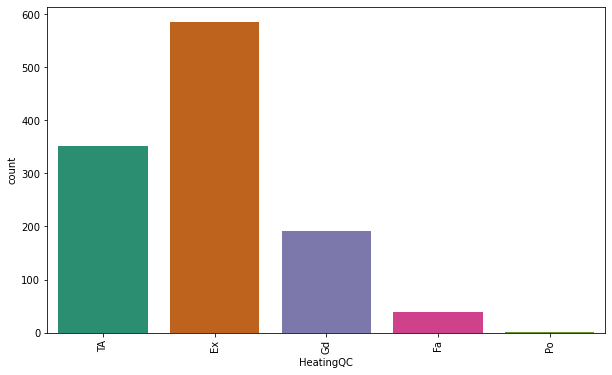

*****************************************************************************************************************************
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


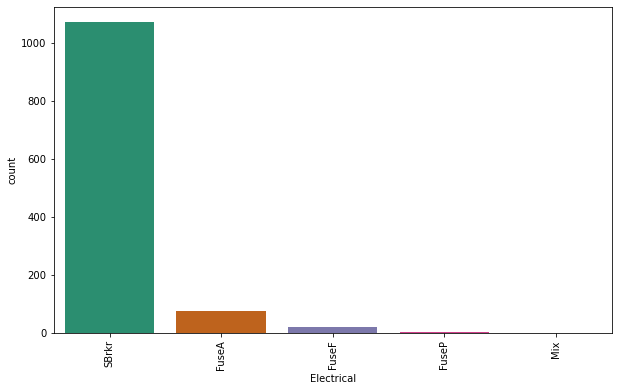

*****************************************************************************************************************************
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


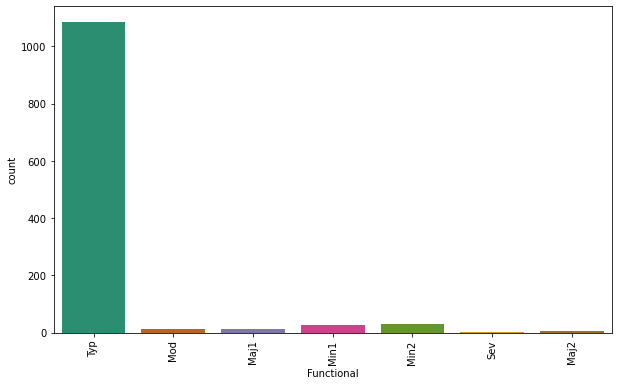

*****************************************************************************************************************************
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


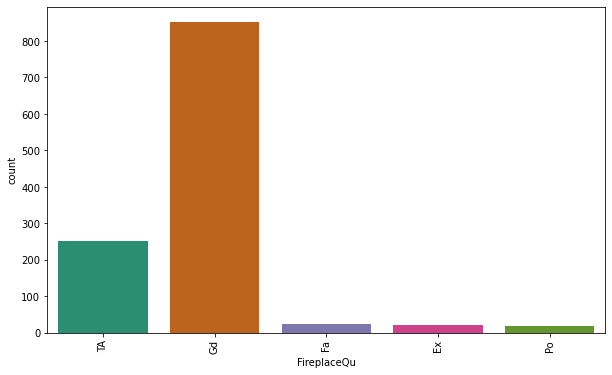

*****************************************************************************************************************************
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


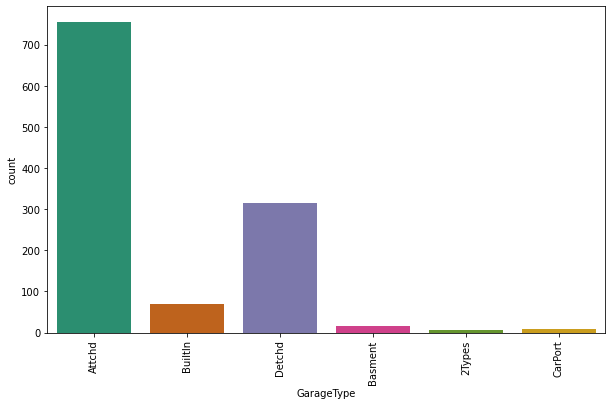

*****************************************************************************************************************************
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


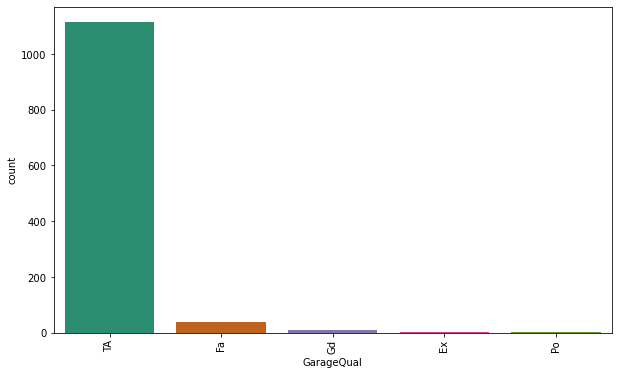

*****************************************************************************************************************************
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


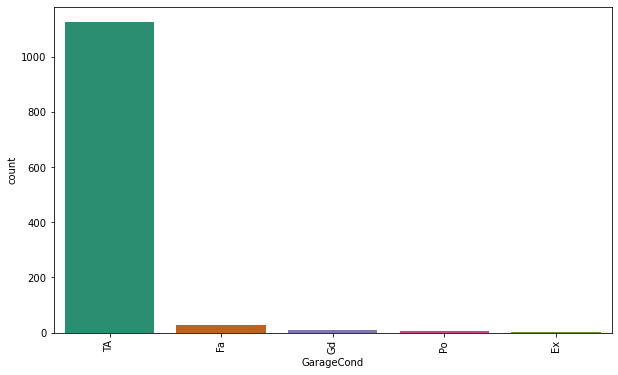

*****************************************************************************************************************************
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


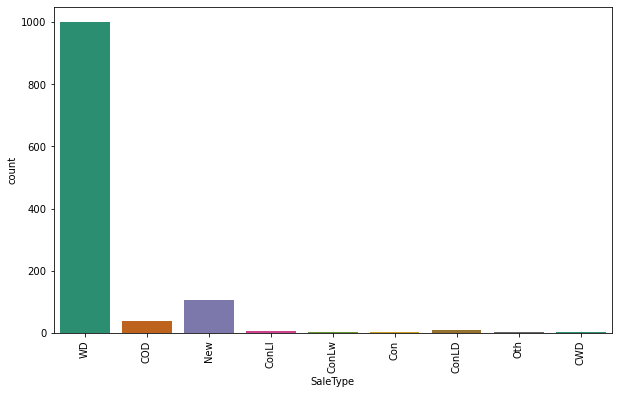

*****************************************************************************************************************************
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


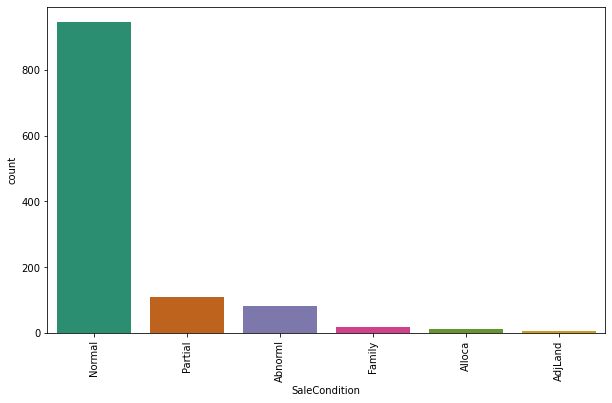

*****************************************************************************************************************************


In [47]:
df1 = train_df[['MSZoning', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterCond', 'Foundation', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'Functional', 'FireplaceQu', 'GarageType', 'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']]
for i in df1:
    print(df1[i].value_counts())
    value_count(i)

# observations:
    
MSZoning: The houses having Residential Low Density zoning of the sale have high count and commercial zoning sale have very less count compared to others.

LotConfig: Inside lot configiration has high count and Frontage on 3 sides of property have very less count compared to others.

Neighborhood: The count is high for the North Ames cities followed by college creek and count is very low for Bluestem.

Condition1: The count is high for the Normal Proximity condition apart from this all the others have very less count.

Condition2: Similar to condition1, in condition2 also Normal proximity has very high count compared to others.

BldgType: Single-family detached dwelling type has very high counts compared to other types have very less count.

HouseStyle: 1 story style of dwelling has high count followed by 2 story and othes have very less count.

RoofStyle: The flat type roof has high count and shed has very less count.

RoofMatl: The roof material type Standard(Composite) Shingle has highest count and others have very less counts.

Exterior1st: Most of the houses have Vinyl Siding exterior covering materials followed by hard board also Brick Common, Asphalt Shingles and limitation Stucco have very count which means there are no more houses with these types.

Exterior2nd: Similar to Exterior1st, here also most of the houses have Vinyi Siding exterior covering materials.

ExterCond: The present condition of the material on the exterior for most of the houses are Average/Typical.

Foundation: Most of the houses have Cinder Block and Poured Contrete type of foundation.

BsmtFinType1: The count is high for the houses having unfinished basement area. Also some houses have Good Living Quarters.

BsmtFinType2: Similar to BsmtFinType1, here also the count is high for unfinished basement.

Heating: Most of the houses have Gas forced warm air furnace heating type.

HeatingQC: Most of the houses have excellent heating quality and condition also some houses have typical/average heatingQC and only 1% of the houses have poor heating quality and condition.

Electrical: The electrical system of the type Standard Circuit Breakers & Romex has very high count which means most of the houses have this facility.

Functionsl: The total number of home functionality of the property for typical functionality have high count compared to others.

FireplaceQu: The houses with Masonry Fireplace in main level have good quality compared to others.

GarageType: The garage location attaches to home has high count also the garage locations detached to home have moderate level of counts. Only few houses have car port and more than one type of garage.

GarageQual: Houses with typical/average garage quality have high count compared to others.

GarageCond: Houses with typical/average garage condition have high count compared to others.

SaleType: Warrranty Deed type of sale has high count followed by Home just constructed and sold.

SaleCondition: Moral sale has high count also the home which was not completed when last assessed also has average sale condition.

# Distribution of skewness
Plotting numerical columns

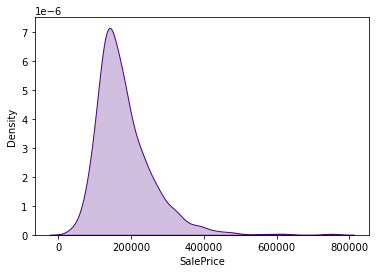

In [48]:
# let's visualize the target variable SalePrice
plt.figure(figsize=(6,4))
sns.distplot(train_df["SalePrice"],color="indigo",kde_kws={"shade": True},hist=False)
plt.show()

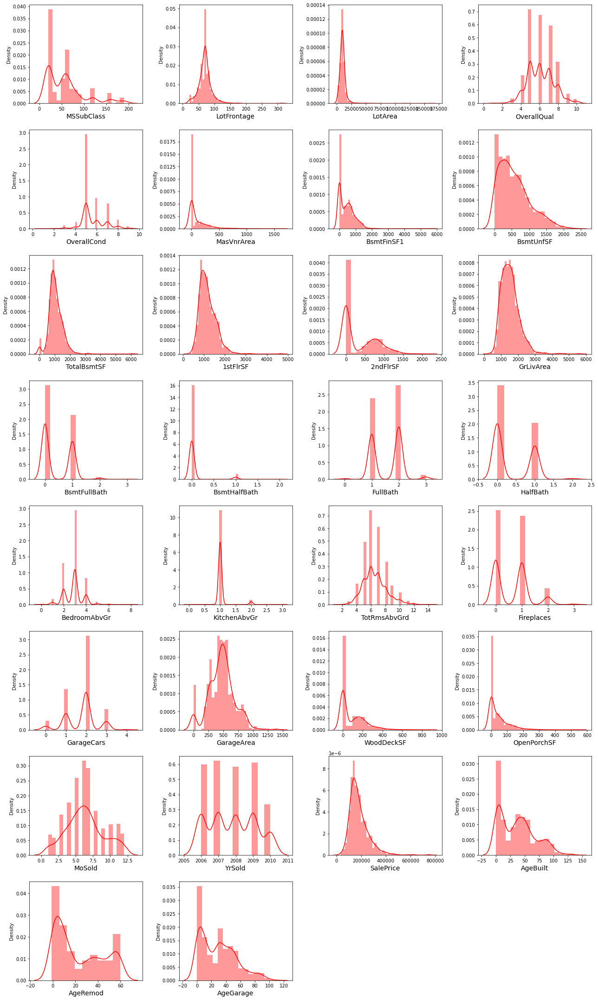

In [49]:
# checking how the data has been distributed in each column

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="r")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

Almost all the columns have skewness and are skewed to right since the mean is greater than the median in these columns. We need to remove this skewness before building our machine learning models.

# Bivariate Analysis
Plotting Nomial variables vs SalePrice

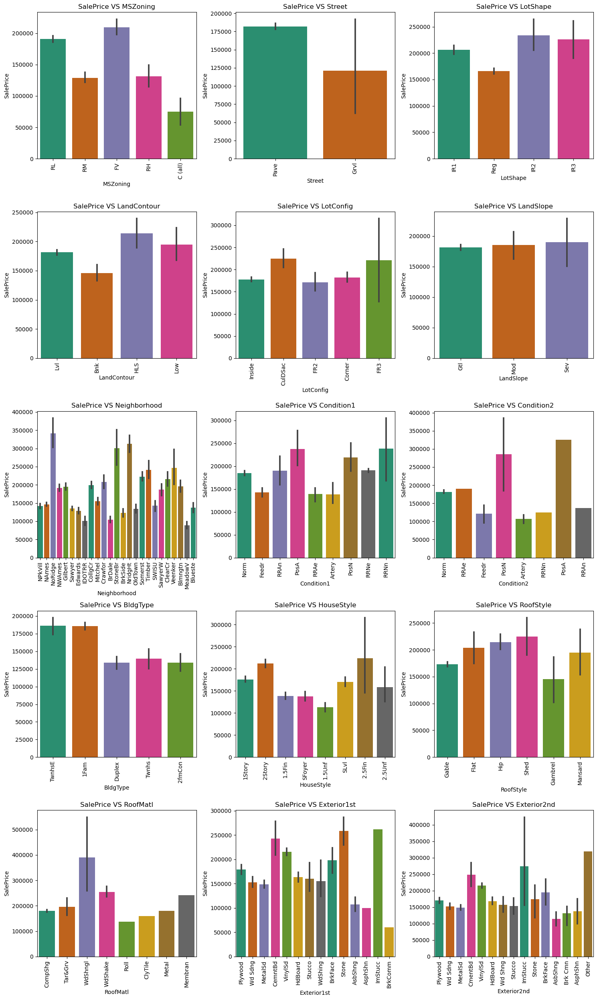

In [50]:
# checking relation between nomial categorical variables and target variable
nominal_data1 = ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data1[i]],palette="Dark2")
    plt.title(f"SalePrice VS {nominal_data1[i]}",fontsize=12)
    plt.xticks(rotation = 90)
    plt.tight_layout()

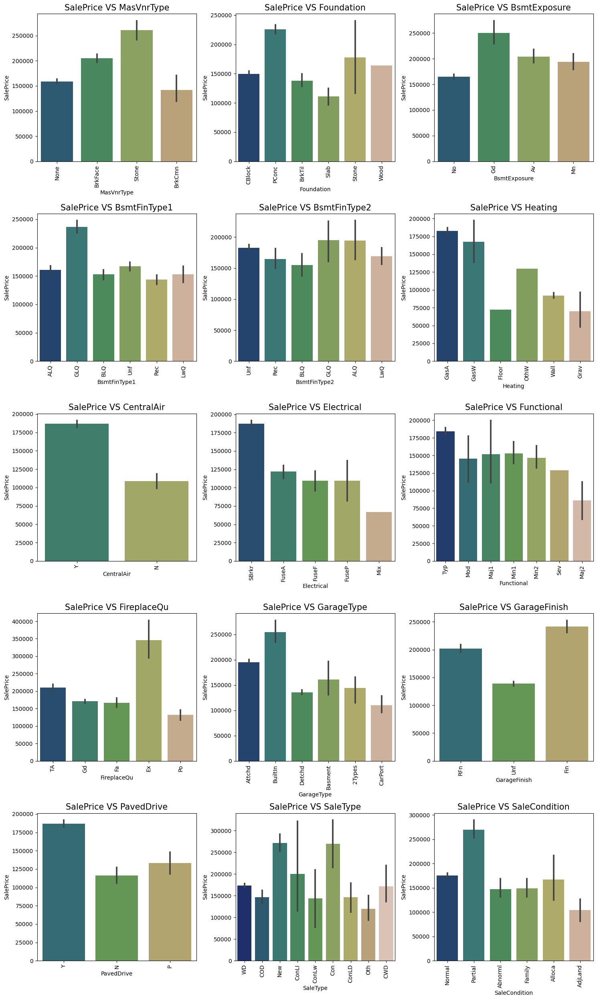

In [51]:
# checking relation between nominal categorical variables and target variable
nominal_data2 = ['MasVnrType', 'Foundation', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'CentralAir', 'Electrical', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'PavedDrive', 'SaleType', 'SaleCondition']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data2)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data2[i]],palette="gist_earth")
    plt.title(f"SalePrice VS {nominal_data2[i]}",fontsize=15)
    plt.xticks(rotation = 90)
    plt.tight_layout()

# Plotting Ordinal Variables vs SalePrice

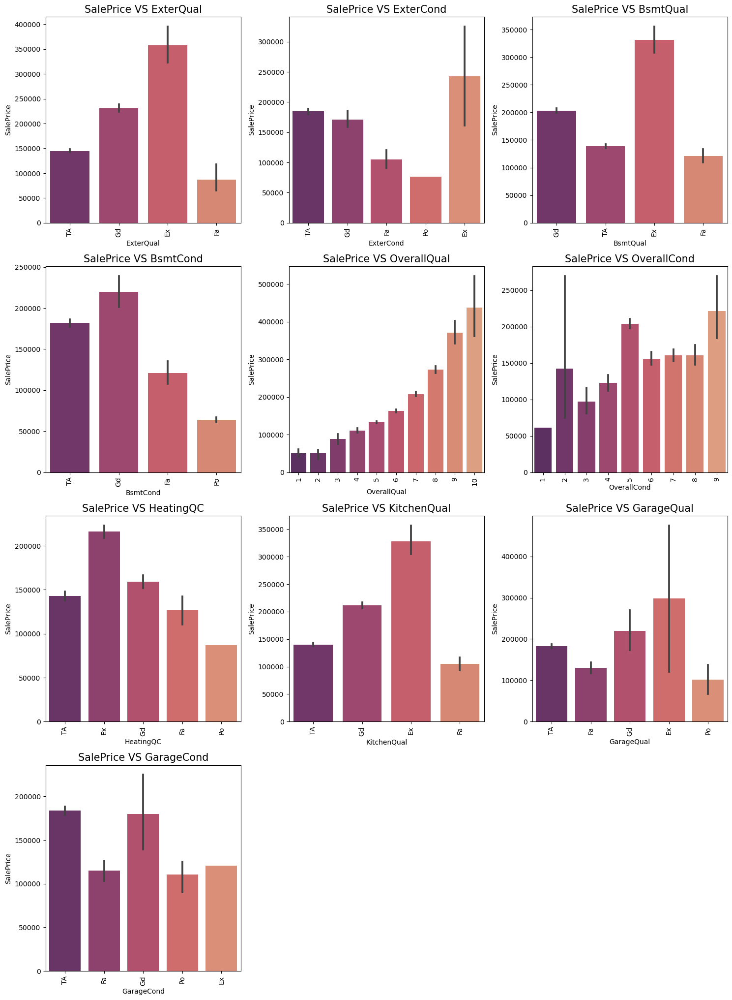

In [52]:
# checking relation between ordinal categorical variables and target variable
ordinal_data = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'OverallQual', 'OverallCond', 'HeatingQC', 'KitchenQual', 'GarageQual', 'GarageCond']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(ordinal_data)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[ordinal_data[i]],palette="flare_r")
    plt.title(f"SalePrice VS {ordinal_data[i]}",fontsize=15)
    plt.xticks(rotation = 90)
    plt.tight_layout()

# Plotting Continuous Variables vs SalePrice

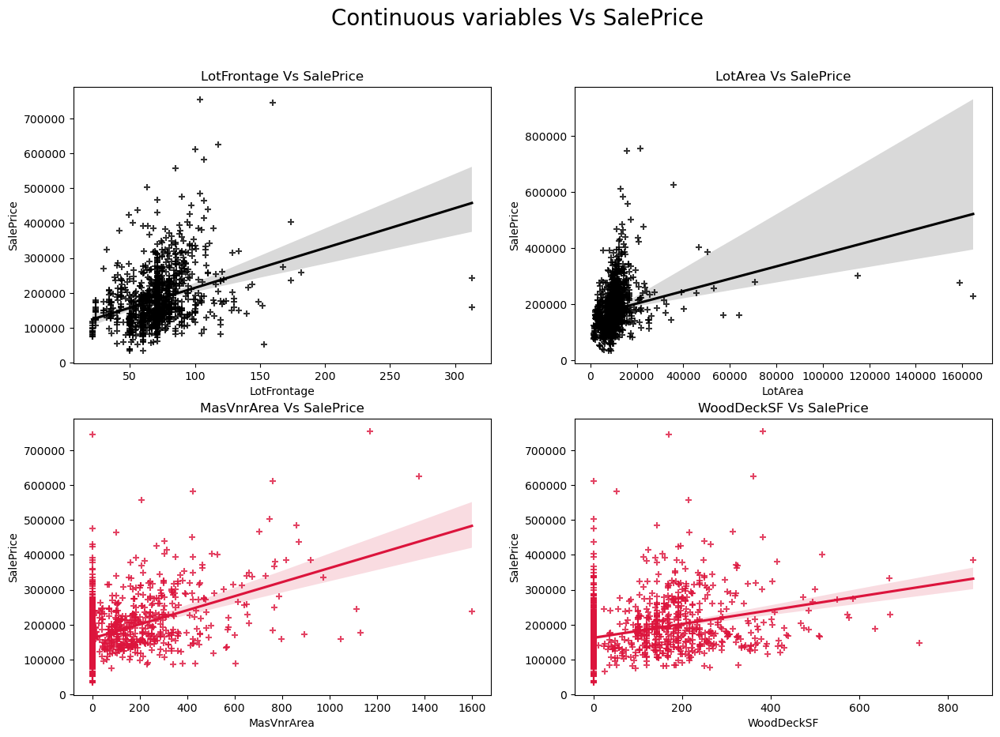

In [53]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('LotFrontage Vs SalePrice')
sns.regplot(x='LotFrontage',y='SalePrice',data=train_df,marker="+",color='k')

plt.subplot(2,2,2)
plt.title('LotArea Vs SalePrice')
sns.regplot(x='LotArea',y='SalePrice',data=train_df,marker="+",color='k')

plt.subplot(2,2,3)
plt.title('MasVnrArea Vs SalePrice')
sns.regplot(x='MasVnrArea',y='SalePrice',data=train_df,marker="+",color='crimson')

plt.subplot(2,2,4)
plt.title('WoodDeckSF Vs SalePrice')
sns.regplot(x='WoodDeckSF',y='SalePrice',data=train_df,marker="+",color='crimson')
plt.show()

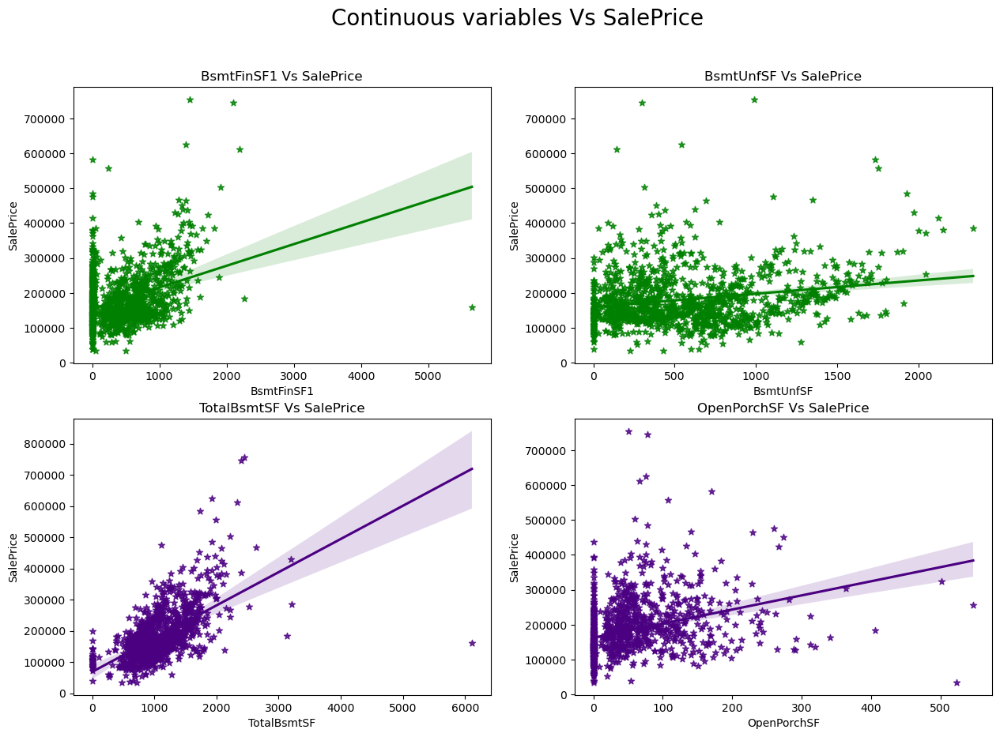

In [54]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFinSF1 Vs SalePrice')
sns.regplot(x='BsmtFinSF1',y='SalePrice',data=train_df,marker="*",color='g')

plt.subplot(2,2,2)
plt.title('BsmtUnfSF Vs SalePrice')
sns.regplot(x='BsmtUnfSF',y='SalePrice',data=train_df,marker="*",color='g')

plt.subplot(2,2,3)
plt.title('TotalBsmtSF Vs SalePrice')
sns.regplot(x='TotalBsmtSF',y='SalePrice',data=train_df,marker="*",color='indigo')

plt.subplot(2,2,4)
plt.title('OpenPorchSF Vs SalePrice')
sns.regplot(x='OpenPorchSF',y='SalePrice',data=train_df,marker="*",color='indigo')
plt.show()

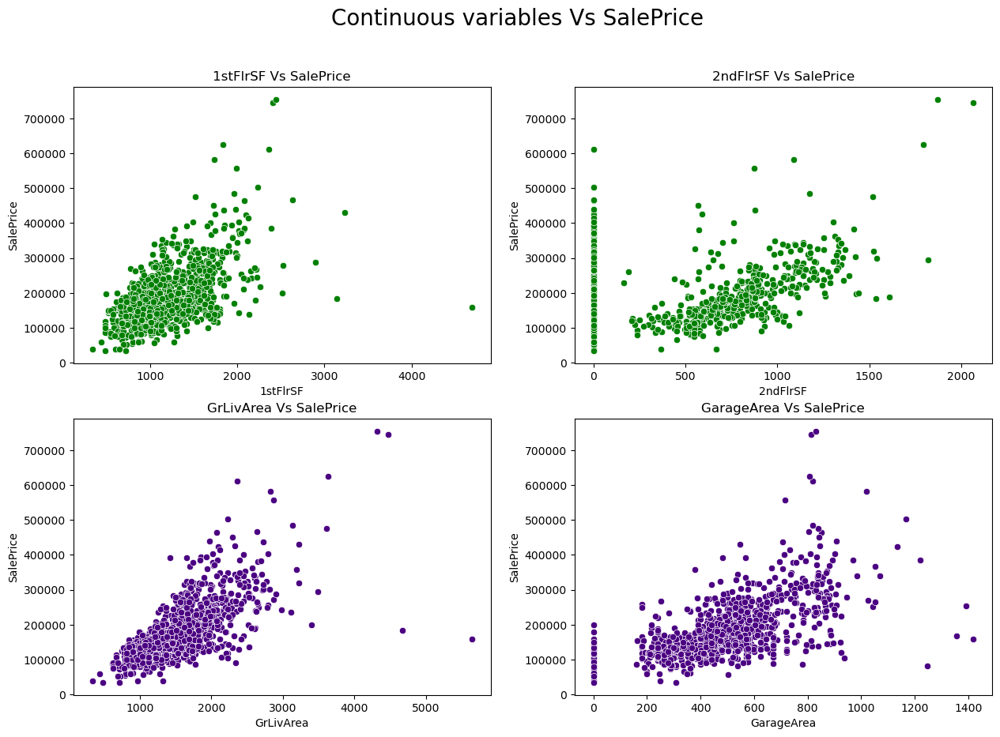

In [55]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('1stFlrSF Vs SalePrice')
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,2)
plt.title('2ndFlrSF Vs SalePrice')
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,3)
plt.title('GrLivArea Vs SalePrice')
sns.scatterplot(x='GrLivArea',y='SalePrice',data=train_df,color='indigo')

plt.subplot(2,2,4)
plt.title('GarageArea Vs SalePrice')
sns.scatterplot(x='GarageArea',y='SalePrice',data=train_df,color='indigo')
plt.show()

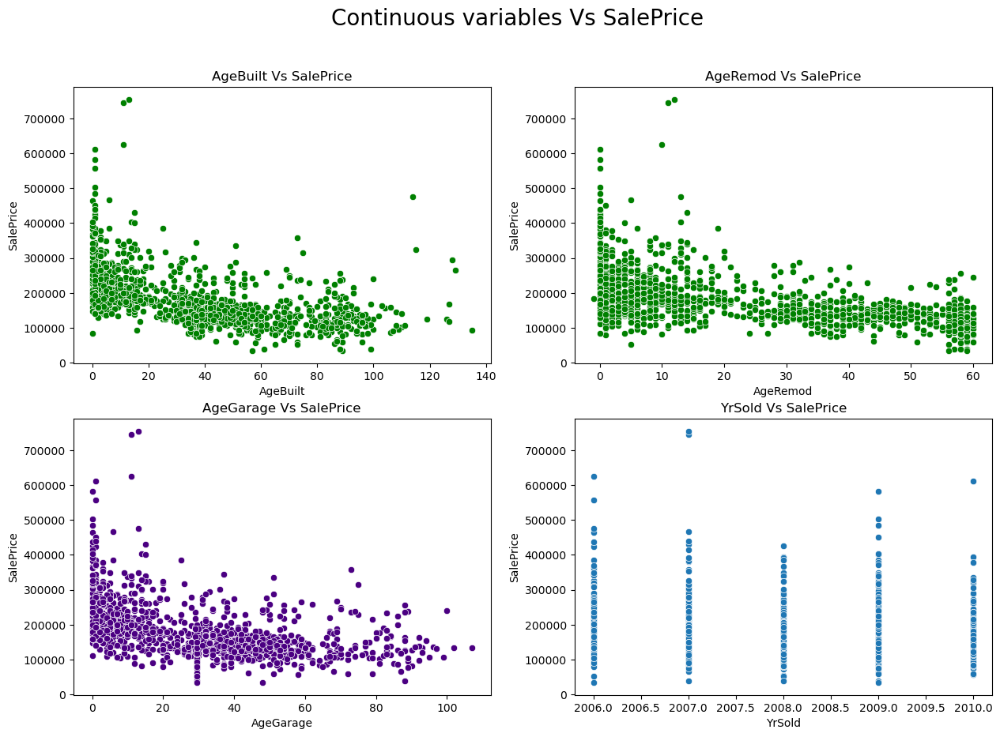

In [56]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('AgeBuilt Vs SalePrice')
sns.scatterplot(x='AgeBuilt',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,2)
plt.title('AgeRemod Vs SalePrice')
sns.scatterplot(x='AgeRemod',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,3)
plt.title('AgeGarage Vs SalePrice')
sns.scatterplot(x='AgeGarage',y='SalePrice',data=train_df,color='indigo')

plt.subplot(2,2,4)
plt.title('YrSold Vs SalePrice')
sns.scatterplot(x='YrSold',y='SalePrice',data=train_df,palette='Dark2')
plt.show()

# Plotting Discrete variables vs SalePrice

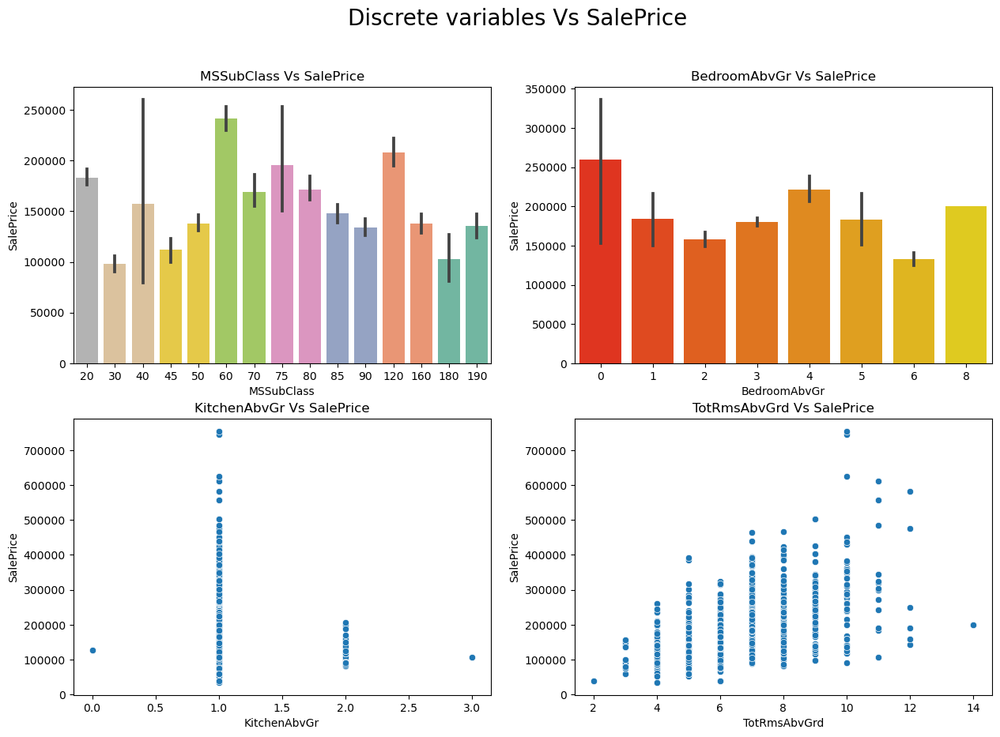

In [57]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('MSSubClass Vs SalePrice')
sns.barplot(x='MSSubClass',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('BedroomAbvGr Vs SalePrice')
sns.barplot(x='BedroomAbvGr',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('KitchenAbvGr Vs SalePrice')
sns.scatterplot(x='KitchenAbvGr',y='SalePrice',data=train_df,palette="magma")

plt.subplot(2,2,4)
plt.title('TotRmsAbvGrd Vs SalePrice')
sns.scatterplot(x='TotRmsAbvGrd',y='SalePrice',data=train_df,palette='mako')
plt.show()

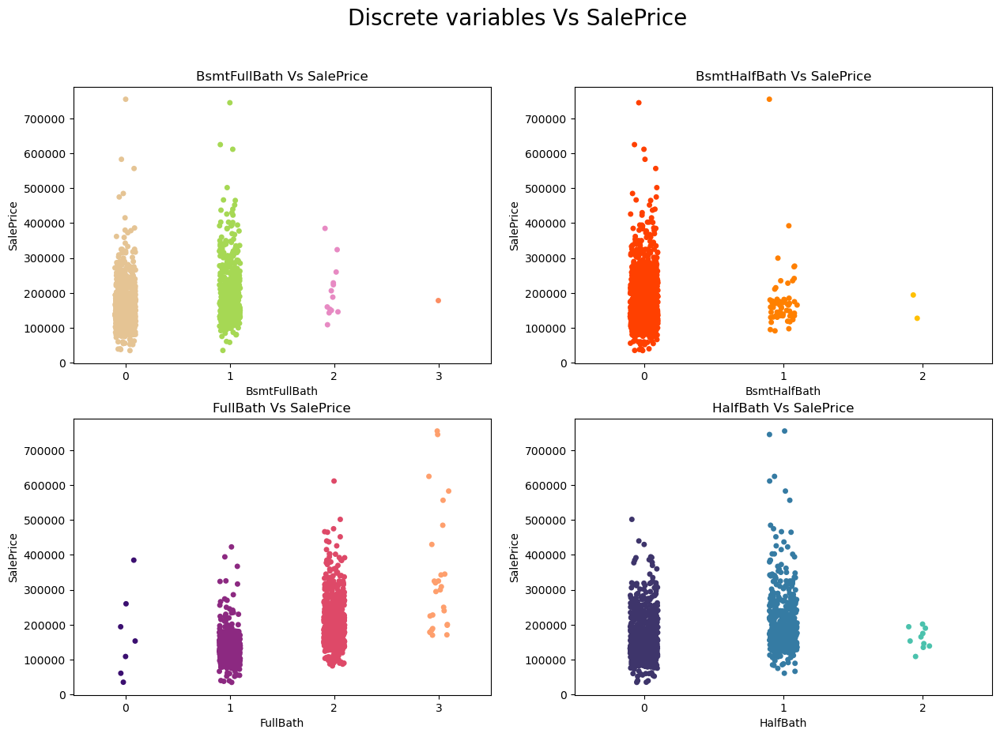

In [58]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFullBath Vs SalePrice')
sns.stripplot(x='BsmtFullBath',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('BsmtHalfBath Vs SalePrice')
sns.stripplot(x='BsmtHalfBath',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('FullBath Vs SalePrice')
sns.stripplot(x='FullBath',y='SalePrice',data=train_df,palette="magma")

plt.subplot(2,2,4)
plt.title('HalfBath Vs SalePrice')
sns.stripplot(x='HalfBath',y='SalePrice',data=train_df,palette='mako')
plt.show()

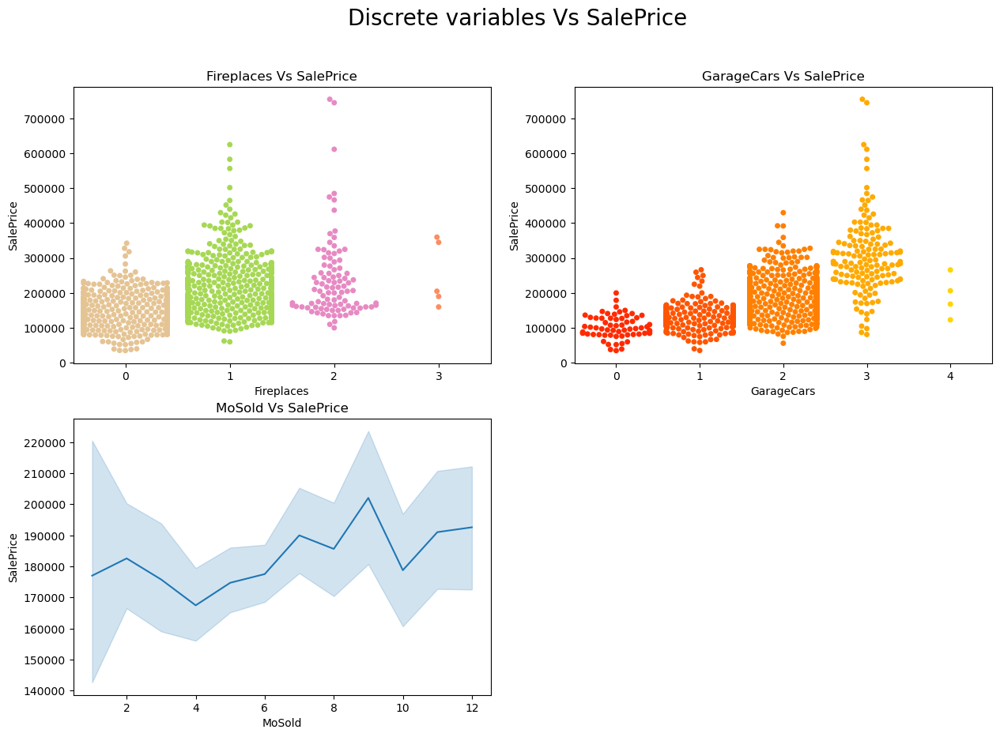

In [59]:
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('Fireplaces Vs SalePrice')
sns.swarmplot(x='Fireplaces',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('GarageCars Vs SalePrice')
sns.swarmplot(x='GarageCars',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('MoSold Vs SalePrice')
sns.lineplot(x='MoSold',y='SalePrice',data=train_df)

plt.show()

# Removing Outliers in train dataset
Zscore Method

In [60]:
# feature containing outliers
features_tr = train_df[['MSSubClass','LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemod', 'AgeGarage']]

# using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features_tr))

In [61]:
# creating new dataframe
new_train_df = train_df[(z<3).all(axis=1)]
new_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,...,0,205,2,2007,WD,Normal,128000,31,31,30.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,...,81,207,10,2007,WD,Normal,268000,37,37,37.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,...,180,130,6,2007,WD,Normal,269790,11,10,10.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,...,0,122,1,2010,COD,Normal,190000,33,33,33.0
5,60,RL,58.00000,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,...,100,17,11,2006,New,Partial,219210,0,0,0.0


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [62]:
# checking the shape of dataset before and after removing outliers
print("Shape of train dataset before removing outliers:", train_df.shape)
print("Shape of train dataset after removing outliers:", new_train_df.shape)

Shape of train dataset before removing outliers: (1168, 68)
Shape of train dataset after removing outliers: (945, 68)


In [63]:
# checking the data loss after removing outliers
data_loss = (1168-945)/1168*100
data_loss

19.09246575342466

By using Zscore I am losing around 19% of data which is not acceptable. The acceptable range of data loss is less than 10. So let's try to remove outliers using IQR method.

# IQR(Inter Quantile Range) Method

In [64]:
# 1st quantile
Q1 = features_tr.quantile(0.25)

# 3rd quantile
Q3 = features_tr.quantile(0.75)

# IQR
IQR = Q3 - Q1

train_df1 = train_df[~((train_df < (Q1 - 1.5 * IQR)) |(train_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [65]:
print("Shape of train data after using IQR method:", train_df1.shape)

Shape of train data after using IQR method: (756, 68)


In [66]:
# checking the data loss after removing outliers
data_loss = (1168-756)/1168*100
data_loss

35.273972602739725

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

In [67]:
# Removing outliers in train data using percentile method
for col in features_tr:
    if train_df[col].dtypes != 'object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]

# Identifying the outliers in test dataset

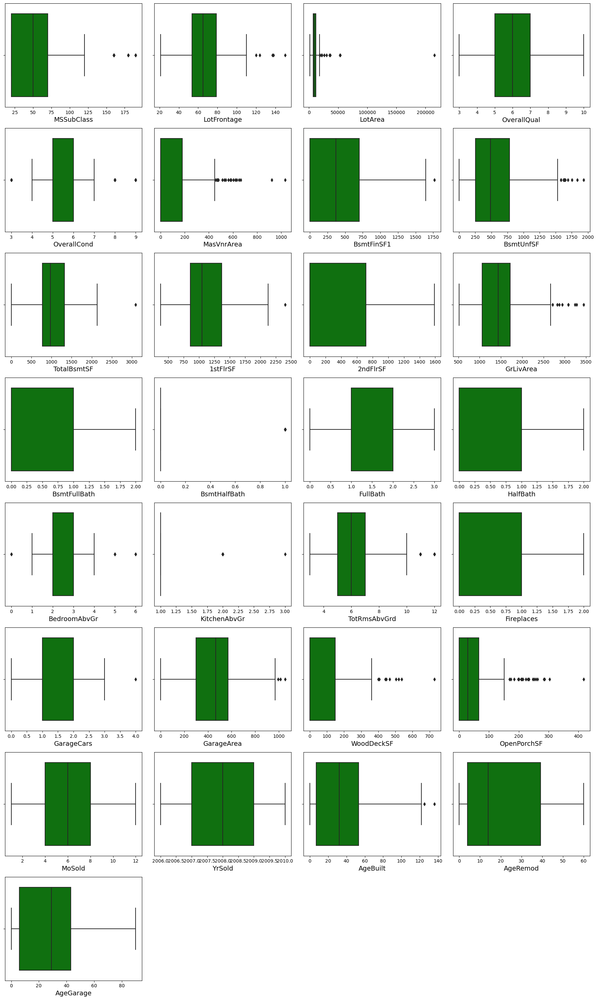

In [68]:
# identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_colte:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(test_df[column],color="g")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

# Removing outliers in test dataset

Zscore Method

In [69]:
# feature containing outliers
features_te = test_df[['MSSubClass','LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemod', 'AgeGarage']]

# using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features_te))

In [70]:
# creating new dataframe
new_test_df = test_df[(z<3).all(axis=1)]
new_test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage


In [71]:
# checking the shape of dataset before and after removing outliers
print("Shape of test dataset before removing outliers:", test_df.shape)
print("Shape of test dataset after removing outliers:", new_test_df.shape)

Shape of test dataset before removing outliers: (292, 67)
Shape of test dataset after removing outliers: (0, 67)


In [72]:
# checking the data loss after removing outliers
data_loss = (292-0)/292*100
data_loss

100.0

By using Zscore I am losing all data which is not acceptable. The acceptable range of data loss is less than 10. So let's try to remove outliers using IQR method.

# IQR(Inter Quantile Range) Method

In [73]:
# 1st quantile
Q1 = features_te.quantile(0.25)

# 3rd quantile
Q3 = features_te.quantile(0.75)

# IQR
IQR = Q3 - Q1

test_df1 = test_df[~((test_df < (Q1 - 1.5 * IQR)) |(test_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [74]:
print("Shape of test data after using IQR method: ",test_df1.shape)

Shape of test data after using IQR method:  (184, 67)


In [75]:
# checking the data loss after removing outliers
data_loss = (292-184)/292*100
data_loss

36.986301369863014

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

# Percentile Method

In [76]:
# removing outliers in train data using percentile method
for col1 in features_te:
    if test_df[col1].dtypes != 'object':
        percentile = test_df[col1].quantile([0.01,0.98]).values
        test_df[col1][test_df[col1]<=percentile[0]]=percentile[0]
        test_df[col1][test_df[col1]>=percentile[1]]=percentile[1]

Checking for skewness in train data

In [77]:
# checking the skewness
train_df.skew()

MSSubClass      1.422019
LotFrontage     0.188060
LotArea         1.191912
OverallQual     0.175082
OverallCond     0.580714
MasVnrArea      1.873138
BsmtFinSF1      0.639523
BsmtUnfSF       0.777624
TotalBsmtSF     0.166773
1stFlrSF        0.645842
2ndFlrSF        0.717390
GrLivArea       0.592755
BsmtFullBath    0.355224
BsmtHalfBath    3.954345
FullBath        0.166941
HalfBath        0.494488
BedroomAbvGr   -0.145762
KitchenAbvGr    4.374289
TotRmsAbvGrd    0.443931
Fireplaces      0.552677
GarageCars     -0.434745
GarageArea     -0.135675
WoodDeckSF      1.053617
OpenPorchSF     1.513678
MoSold          0.220979
YrSold          0.115765
SalePrice       1.953878
AgeBuilt        0.469054
AgeRemod        0.492893
AgeGarage       0.598789
dtype: float64

Removing skewness using Yeo-Johnson method

In [78]:
# removing skewness using yeo-johnson method to get better prediction
skew1 = ["MSSubClass", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BsmtHalfBath", "HalfBath", "KitchenAbvGr", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "SalePrice", "AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [79]:
train_df[skew1] = scaler.fit_transform(train_df[skew1].values)
train_df[skew1].head()

,MSSubClass,LotArea,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,Fireplaces,WoodDeckSF,OpenPorchSF,SalePrice,AgeGarage
0,1.370435,-1.306083,-0.496528,-0.822896,-0.117054,0.916764,-0.481887,-0.871789,-1.281768,-0.238775,-0.783109,-3.122502e-17,0.779453,-0.960144,1.423871,-0.671353,0.284279
1,-1.167999,1.356458,0.407009,-0.822896,0.395541,1.042594,2.082190,-0.871789,1.377184,-0.238775,-0.783109,-3.122502e-17,0.779453,0.783831,1.428474,1.181174,0.520844
2,0.490047,0.113089,-0.496528,-0.822896,0.934402,-0.510359,0.048689,1.177246,1.060650,-0.238775,1.276961,-3.122502e-17,0.779453,1.047285,1.208580,1.197587,-0.652949
3,-1.167999,0.530989,0.407009,1.385487,0.803940,1.178365,1.665038,-0.871789,0.775546,-0.238775,-0.783109,-3.122502e-17,0.779453,-0.960144,1.178672,0.326442,0.389131
4,-1.167999,1.497522,1.234321,1.140684,1.189724,-0.230032,1.201931,-0.871789,0.322952,4.188040,-0.783109,-3.122502e-17,0.779453,1.139237,-1.062308,0.635122,0.354804


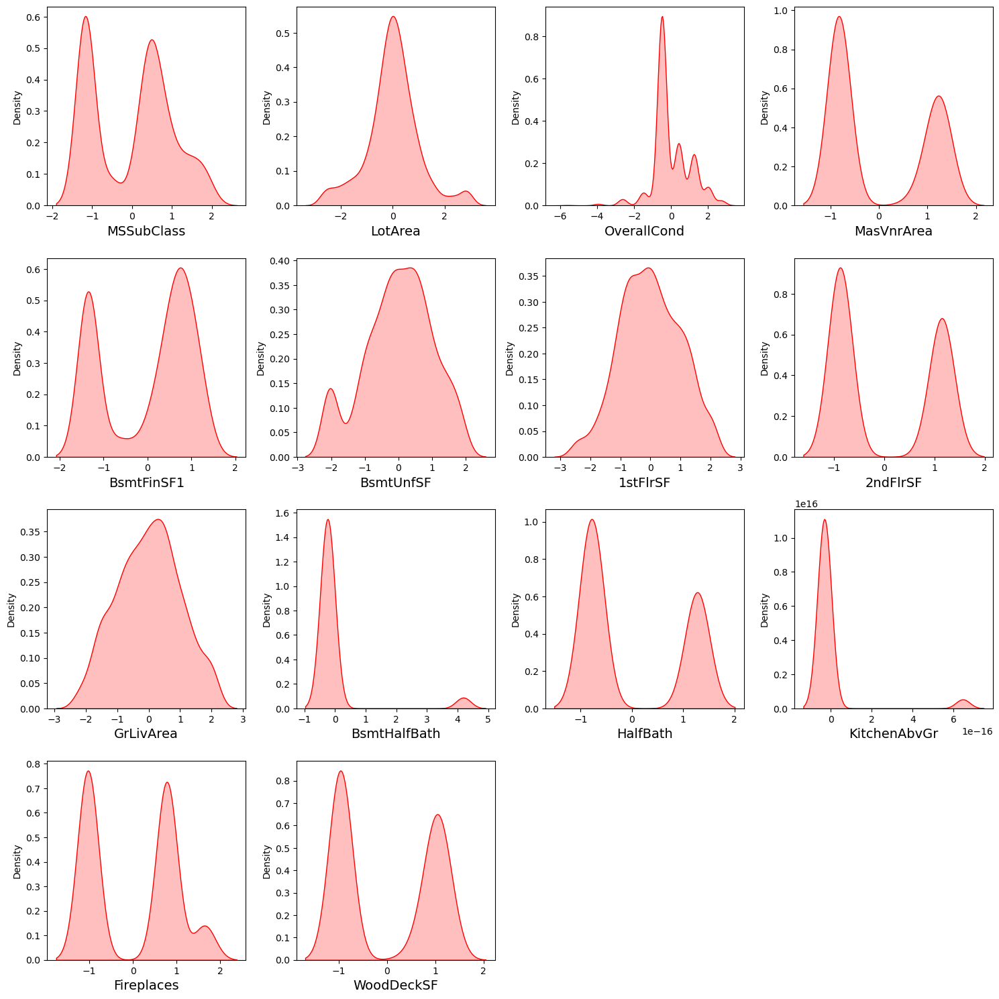

In [80]:
# checking how the data has been distributed in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in train_df[skew1] :
    if plotnumber<=14:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(train_df[column],color="r",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [81]:
# checking skewness after using yeo-johnson method
train_df[skew1].skew()

MSSubClass      0.064007
LotArea         0.077861
OverallCond     0.048063
MasVnrArea      0.415092
BsmtFinSF1     -0.418554
BsmtUnfSF      -0.304290
1stFlrSF       -0.000731
2ndFlrSF        0.279883
GrLivArea      -0.005974
BsmtHalfBath    3.954345
HalfBath        0.494488
KitchenAbvGr    0.000000
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
SalePrice      -0.006010
AgeGarage      -0.217611
dtype: float64

In [82]:
# dropping irrelevant column
train_df.drop("KitchenAbvGr",axis=1,inplace=True)

Checking for skewness in test data

In [83]:
# checking the skewness
test_df.skew()

MSSubClass      1.323471
LotFrontage     0.004386
LotArea         1.266527
OverallQual     0.397312
OverallCond     1.209714
MasVnrArea      1.543759
BsmtFinSF1      0.639990
BsmtUnfSF       0.873375
TotalBsmtSF     0.149160
1stFlrSF        0.596239
2ndFlrSF        0.689956
GrLivArea       0.790479
BsmtFullBath    0.335025
BsmtHalfBath    3.544994
FullBath       -0.241112
HalfBath        0.619568
BedroomAbvGr   -0.345731
KitchenAbvGr    4.253608
TotRmsAbvGrd    0.627431
Fireplaces      0.540164
GarageCars     -0.356072
GarageArea      0.051450
WoodDeckSF      1.317908
OpenPorchSF     1.790292
MoSold          0.186504
YrSold          0.018412
AgeBuilt        0.623131
AgeRemod        0.530763
AgeGarage       0.633571
dtype: float64

Removing skewness using Yeo-Johnson method

In [84]:
# removing skewness using yeo-johnson method to get better prediction
skew2 = ["MSSubClass", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BsmtHalfBath", "HalfBath", "KitchenAbvGr", "TotRmsAbvGrd", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "AgeBuilt", "AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''

parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\n\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [85]:
test_df[skew2] = scaler.fit_transform(test_df[skew2].values)
test_df[skew2].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,AgeBuilt,AgeGarage
0,-1.149822,1.012372,1.188705,1.212776,0.459512,1.831025,-0.870332,0.966245,-0.263813,-0.738223,-1.040834e-17,0.981907,0.808861,1.121289,0.720332,-1.417238,-1.355074
1,1.341197,-0.878055,-0.843333,1.071176,-0.847801,0.748588,-0.870332,-0.083846,-0.263813,-0.738223,-1.040834e-17,-1.613568,0.808861,0.815051,-1.112306,-0.008559,0.189570
2,-1.149822,0.565525,-0.843333,-1.376632,1.999450,1.606536,-0.870332,0.744611,-0.263813,-0.738223,-1.040834e-17,0.449228,0.808861,1.156129,1.287751,-0.830966,-0.712210
3,0.706032,0.598156,-0.843333,0.235999,-0.094676,-0.717217,1.138156,0.337234,-0.263813,1.354604,-1.040834e-17,0.449228,0.808861,-0.913781,-1.112306,1.066994,1.368916
4,0.507373,1.092887,0.960350,-1.376632,0.880166,-0.591803,1.212102,0.983798,-0.263813,1.354604,-1.040834e-17,1.463878,0.808861,0.955750,0.216312,-1.583151,-1.537003


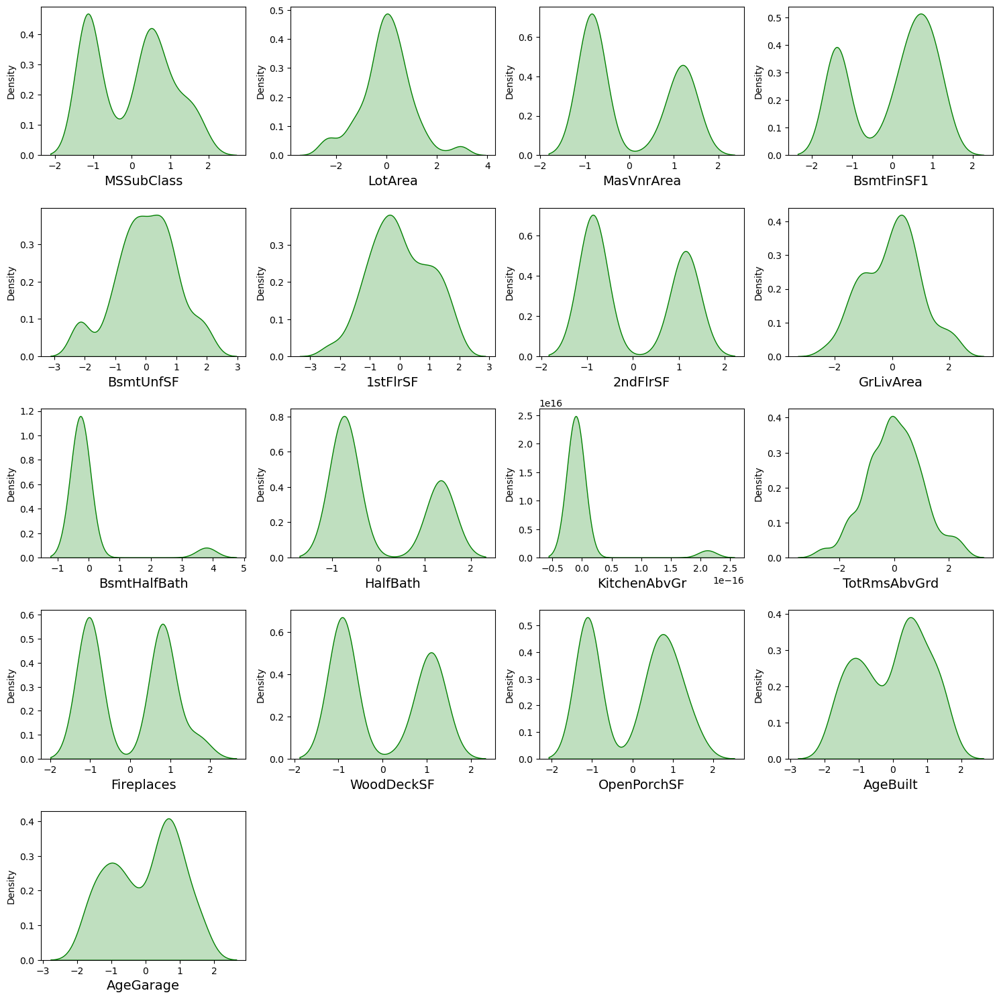

In [86]:
# checking how the data has been distributed in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in test_df[skew2] :
    if plotnumber<=17:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(test_df[column],color="g",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [87]:
# checking skewness after using yeo-johnson method
test_df[skew2].skew()

MSSubClass      0.088585
LotArea         0.075717
MasVnrArea      0.369830
BsmtFinSF1     -0.447437
BsmtUnfSF      -0.247815
1stFlrSF        0.003835
2ndFlrSF        0.283971
GrLivArea      -0.003046
BsmtHalfBath    3.544994
HalfBath        0.619568
KitchenAbvGr    0.000000
TotRmsAbvGrd    0.000698
Fireplaces      0.076669
WoodDeckSF      0.208541
OpenPorchSF    -0.065103
AgeBuilt       -0.190514
AgeGarage      -0.183763
dtype: float64

In [88]:
test_df.drop("KitchenAbvGr",axis=1,inplace=True)

# Encoding Train DataFrame

In [89]:
column = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond']
for i in column:
    train_df[i] = train_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [90]:
# encoding train dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in train_df.columns:
    if train_df[i].dtypes == "object":
        train_df[i] = enc.fit_transform(train_df[i].values.reshape(-1,1))
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,3.0,70.98847,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,...,-0.960144,1.423871,2,2007,8.0,4.0,-0.671353,31.0,31,0.284279
1,-1.167999,3.0,95.00000,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,...,0.783831,1.428474,10,2007,8.0,4.0,1.181174,37.0,37,0.520844
2,0.490047,3.0,92.00000,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,...,1.047285,1.208580,6,2007,8.0,4.0,1.197587,11.0,10,-0.652949
3,-1.167999,3.0,105.00000,0.530989,1.0,0.0,3.0,4.0,0.0,14.0,...,-0.960144,1.178672,1,2010,0.0,4.0,0.326442,33.0,33,0.389131
4,-1.167999,3.0,70.98847,1.497522,1.0,0.0,3.0,2.0,0.0,14.0,...,1.139237,-1.062308,6,2009,8.0,4.0,0.635122,32.0,9,0.354804


# Encoding Test DataFrame

In [91]:
# replacing ratings by numbers on the  basis of specific condition
columns = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond']
for i in columns:
    test_df[i] = test_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [92]:
# encoding test dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in test_df.columns:
    if test_df[i].dtypes == 'object':
        test_df[i] = enc.fit_transform(test_df[i].values.reshape(-1,1))
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,2.0,86.0,1.012372,1.0,0.0,1.0,0.0,0.0,21.0,...,2.0,1.121289,0.720332,7,2007,5.0,2.0,-1.417238,1,-1.355074
1,1.341197,2.0,NaN,-0.878055,1.0,0.0,3.0,1.0,0.0,21.0,...,2.0,0.815051,-1.112306,8,2009,0.0,0.0,-0.008559,25,0.189570
2,-1.149822,2.0,NaN,0.565525,1.0,3.0,3.0,4.0,0.0,4.0,...,2.0,1.156129,1.287751,6,2009,5.0,2.0,-0.830966,8,-0.712210
3,0.706032,2.0,75.0,0.598156,1.0,3.0,0.0,4.0,0.0,5.0,...,2.0,-0.913781,-1.112306,7,2009,5.0,2.0,1.066994,59,1.368916
4,0.507373,2.0,86.0,1.092887,1.0,0.0,3.0,1.0,0.0,20.0,...,2.0,0.955750,0.216312,1,2008,5.0,2.0,-1.583151,1,-1.537003


# Correlation between the label and features using HEAT map in Train dataset

In [93]:
# checking the correlation between features and the target
cor = train_df.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.026898,-0.316274,-0.312939,-0.017924,0.067516,-0.030467,0.057130,-0.016595,-0.011619,...,0.038922,0.062935,0.010865,-0.042020,0.064683,-0.027825,0.015462,0.005669,-0.055233,-0.058538
MSZoning,0.026898,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,...,0.006946,-0.182359,-0.051646,-0.004964,0.079854,0.004501,-0.149417,0.296616,0.174297,0.278292
LotFrontage,-0.316274,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,...,0.065003,0.168784,0.027718,-0.005074,-0.040647,0.076587,0.357794,-0.129581,-0.080880,-0.072003
LotArea,-0.312939,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,...,0.125098,0.146222,0.021311,-0.039843,-0.022130,0.046115,0.399480,-0.029530,-0.031199,0.019759
Street,-0.017924,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,...,0.022918,0.017900,-0.008860,-0.019635,0.025920,0.014176,0.069519,-0.022127,-0.059228,-0.024426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SaleCondition,-0.027825,0.004501,0.076587,0.046115,0.014176,-0.054905,0.047715,0.043692,-0.061461,0.042340,...,0.084122,0.135211,-0.003462,0.024505,0.143557,1.000000,0.261657,-0.212974,-0.225744,-0.246566
SalePrice,0.015462,-0.149417,0.357794,0.399480,0.069519,-0.271434,0.043913,-0.064489,0.004183,0.190619,...,0.333356,0.476116,0.087476,-0.048730,-0.036107,0.261657,1.000000,-0.588992,-0.574324,-0.538975
AgeBuilt,0.005669,0.296616,-0.129581,-0.029530,-0.022127,0.231985,-0.157325,-0.009967,0.087505,-0.117093,...,-0.289535,-0.411553,-0.039361,0.056461,0.062211,-0.212974,-0.588992,1.000000,0.607604,0.799459
AgeRemod,-0.055233,0.174297,-0.080880,-0.031199,-0.059228,0.156642,-0.086152,0.008715,0.048010,-0.090129,...,-0.275569,-0.400488,-0.033493,0.029700,-0.019820,-0.225744,-0.574324,0.607604,1.000000,0.670037


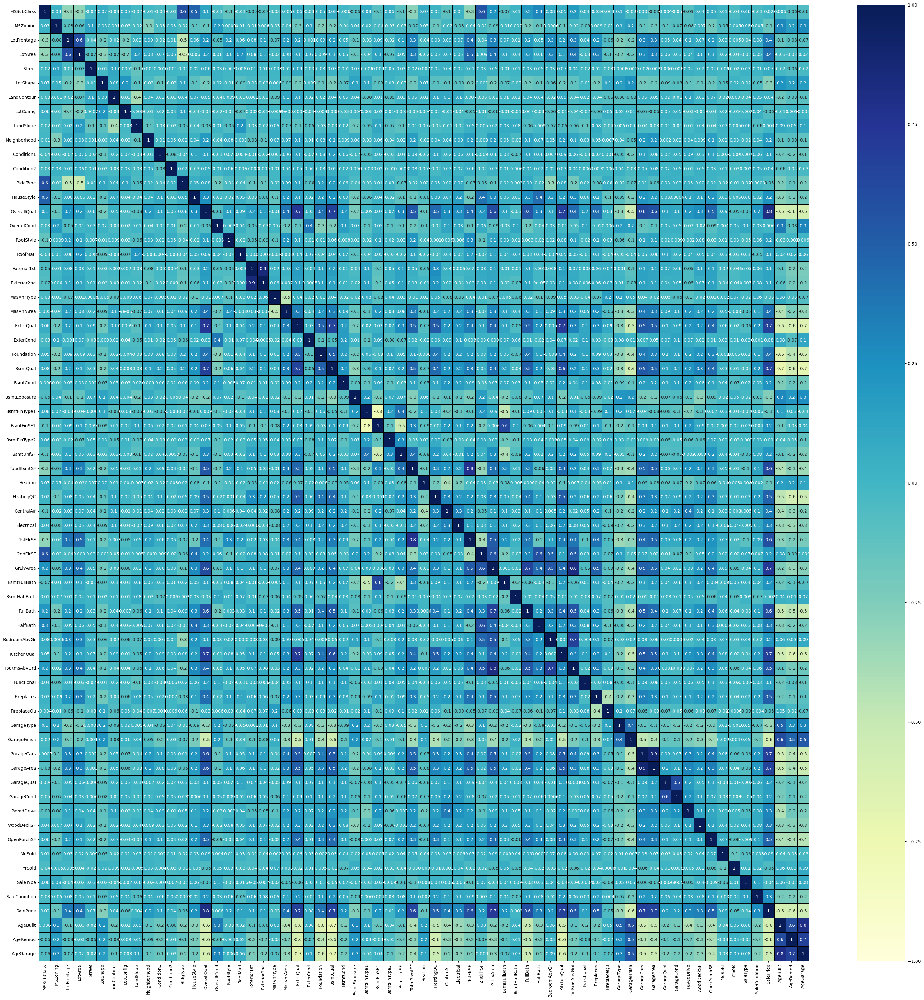

In [94]:
# visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))
sns.heatmap(train_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="YlGnBu")
plt.yticks(rotation=0);

# Important features that affect SalePrice positively and negatively

In [95]:
cor['SalePrice'].sort_values(ascending=False)

SalePrice       1.000000
OverallQual     0.817389
GrLivArea       0.725214
GarageCars      0.677654
ExterQual       0.668797
                  ...   
GarageType     -0.337096
AgeGarage      -0.538975
AgeRemod       -0.574324
GarageFinish   -0.575923
AgeBuilt       -0.588992
Name: SalePrice, Length: 67, dtype: float64

# Visualizing the correlation between label and features using bar plot

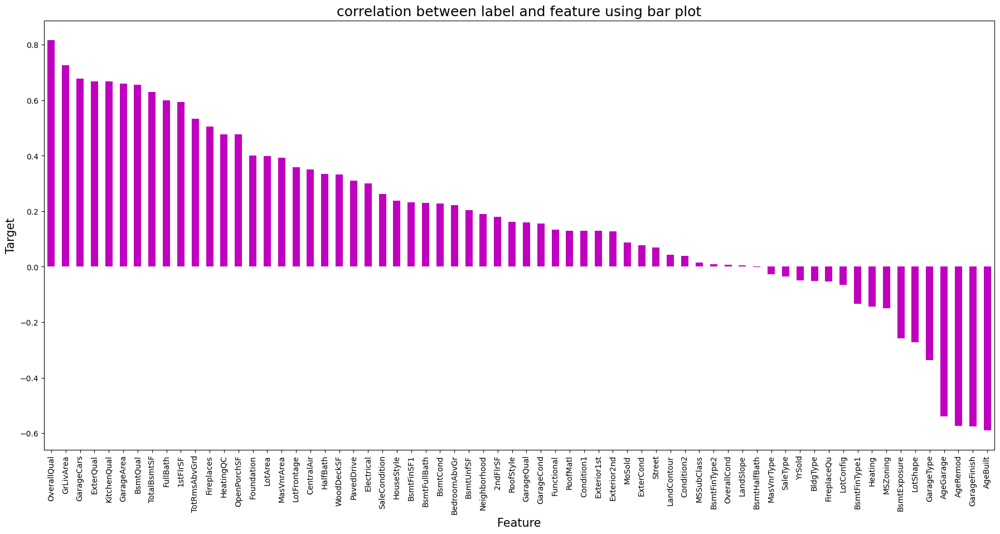

In [96]:
plt.figure(figsize=(22,10))
train_df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='m')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

# Checking correlation between the features in test data

In [97]:
# checking the correlation between features
cor1 = test_df.corr()
cor1

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.230922,-0.406228,-0.387652,0.005665,0.126507,0.013631,0.013514,-0.062158,-0.093560,...,-0.018566,0.066206,-0.083760,0.027774,0.022935,-0.090847,-0.043731,0.009205,0.026856,-0.040875
MSZoning,0.230922,1.000000,-0.368428,-0.334747,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,...,-0.236680,-0.101952,-0.186630,0.074308,-0.072716,0.123993,0.005290,0.350378,0.155091,0.283210
LotFrontage,-0.406228,-0.368428,1.000000,0.662879,-0.062231,-0.155805,-0.065011,-0.143618,0.148319,0.206565,...,0.077443,0.028872,0.083211,-0.043177,0.056962,0.038782,0.039437,-0.171025,-0.058920,-0.144964
LotArea,-0.387652,-0.334747,0.662879,1.000000,-0.115787,-0.314092,-0.132902,-0.159049,0.389047,0.167866,...,-0.023073,0.125369,0.157970,-0.062967,0.000591,0.071355,0.062657,-0.101061,-0.074735,-0.064856
Street,0.005665,-0.063162,-0.062231,-0.115787,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,...,-0.023367,-0.002458,-0.019054,0.036965,-0.040272,-0.019125,-0.012345,-0.048795,-0.095147,-0.072173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SaleType,-0.090847,0.123993,0.038782,0.071355,-0.019125,0.072375,0.056451,0.104593,0.052109,-0.113653,...,0.012827,0.018437,-0.022251,0.044305,-0.097726,1.000000,0.349621,0.017494,-0.038730,0.068629
SaleCondition,-0.043731,0.005290,0.039437,0.062657,-0.012345,0.033945,-0.027454,0.092637,0.033637,-0.020793,...,0.033334,-0.010629,0.109149,0.087636,-0.083345,0.349621,1.000000,-0.262182,-0.231620,-0.296246
AgeBuilt,0.009205,0.350378,-0.171025,-0.101061,-0.048795,0.177543,-0.150085,-0.033188,0.056232,-0.099886,...,-0.352099,-0.380776,-0.401492,0.012660,0.064360,0.017494,-0.262182,1.000000,0.685512,0.920098
AgeRemod,0.026856,0.155091,-0.058920,-0.074735,-0.095147,0.153723,-0.116201,-0.011856,0.110976,-0.143912,...,-0.115084,-0.332861,-0.332671,-0.019352,0.019499,-0.038730,-0.231620,0.685512,1.000000,0.714109


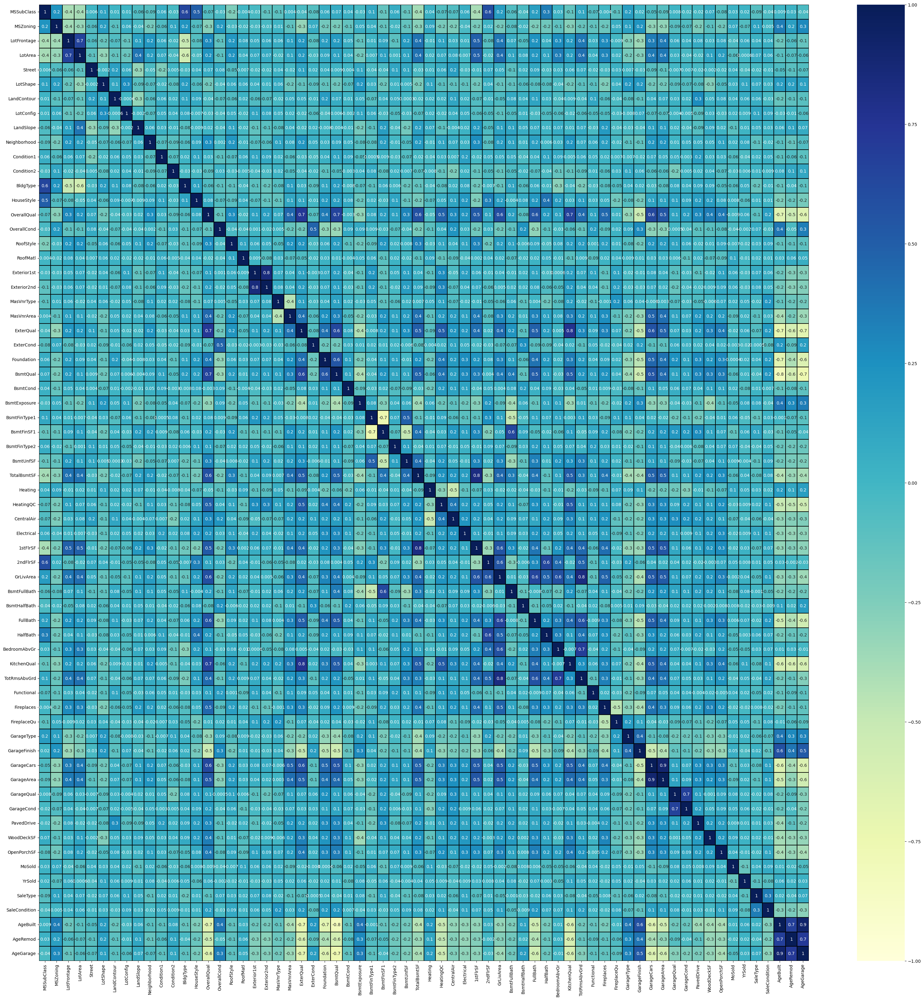

In [98]:
# visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))
sns.heatmap(test_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black",annot=True,cmap="YlGnBu")
plt.yticks(rotation=0);

From the above heat map I can notice the multicolinearity problem as most of the columns are correlated with each other. 

# Separating the feature and label into x and y

In [99]:
x = train_df.drop("SalePrice", axis=1)
y = train_df["SalePrice"]

In [100]:
# dimension of x and y
x.shape, y.shape

((1168, 66), (1168,))

Scaling Train data using StandardScaler

In [101]:
from sklearn.preprocessing import StandardScaler
# scaling data
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,...,0.291828,-0.960144,1.423871,-1.617822,-0.605487,0.330033,0.207932,-0.189926,0.383872,0.284279
1,-1.167999,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,...,0.291828,0.783831,1.428474,1.361470,-0.605487,0.330033,0.207932,0.013316,0.673014,0.520844
2,0.490047,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,...,0.291828,1.047285,1.208580,-0.128176,-0.605487,0.330033,0.207932,-0.867400,-0.628124,-0.652949
3,-1.167999,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,...,0.291828,-0.960144,1.178672,-1.990233,1.651563,-4.612004,0.207932,-0.122178,0.480253,0.389131
4,-1.167999,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,...,0.291828,1.139237,-1.062308,-0.128176,0.899213,0.330033,0.207932,-0.156052,-0.676315,0.354804


Scaling Test data using StandardScaler

In [103]:
# scaling data
scaler = StandardScaler()
test_df = pd.DataFrame(scaler.fit_transform(test_df), columns=test_df.columns)
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,...,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,-0.287006,0.983107,1.012372,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,...,0.281378,1.121289,0.720332,0.276960,-0.650908,0.23029,0.148654,-1.417238,-1.075966,-1.355074
1,1.341197,-0.287006,NaN,-0.878055,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,...,0.281378,0.815051,-1.112306,0.637997,0.863555,-6.49418,-3.323909,-0.008559,0.122249,0.189570
2,-1.149822,-0.287006,NaN,0.565525,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,...,0.281378,1.156129,1.287751,-0.084077,0.863555,0.23029,0.148654,-0.830966,-0.726486,-0.712210
3,0.706032,-0.287006,0.443491,0.598156,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,...,0.281378,-0.913781,-1.112306,0.276960,0.863555,0.23029,0.148654,1.066994,1.819721,1.368916
4,0.507373,-0.287006,0.983107,1.092887,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,...,0.281378,0.955750,0.216312,-1.889261,0.106324,0.23029,0.148654,-1.583151,-1.075966,-1.537003


# Checking VIF(Variance Inflation Factor) values in train dataset

In [104]:
# finding varience inflation factor in each scaled column i.e. x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# let's check the values
vif

,VIF values,Features
0,5.711872,MSSubClass
1,1.363333,MSZoning
2,2.035845,LotFrontage
3,2.647674,LotArea
4,1.105856,Street
...,...,...
61,1.123512,SaleType
62,1.195210,SaleCondition
63,8.346443,AgeBuilt
64,3.165104,AgeRemod


In [105]:
x.drop("GrLivArea",axis=1,inplace=True)

# checking VIF after removing the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# let's check the values
vif

,VIF values,Features
0,5.692211,MSSubClass
1,1.362697,MSZoning
2,2.032097,LotFrontage
3,2.646274,LotArea
4,1.100075,Street
...,...,...
60,1.121698,SaleType
61,1.194947,SaleCondition
62,8.228702,AgeBuilt
63,3.161362,AgeRemod


# Checking VIF(Variance Inflation Factor) values in test dataset

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# checking VIF after removing the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(test_df.values,i)
                     for i in range(len(test_df.columns))]
vif["Features"] = test_df.columns

# let's check the values
vif

In [ ]:
# dropping GrLivArea which has high VIF value
test_df.drop("GrLivArea",axis=1,inplace=True)

In [ ]:
# checking VIF after dropping the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(test_df.values,i)
                     for i in range(len(test_df.columns))]
vif["Features"] = test_df.columns

# let's check the values
vif

# Building ML Models From Train Dataset
Finding the Best Random State and Accuracy

In [107]:
# importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [108]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.8869034049691248  on Random_state  72


# Feature Importance

In [109]:
# let's check the feature importance using Random Forest Regressor

RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFR.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
OverallQual,0.553
GarageCars,0.055
GarageArea,0.049
TotalBsmtSF,0.037
1stFlrSF,0.032
...,...
GarageCond,0.000
Heating,0.000
SaleType,0.000


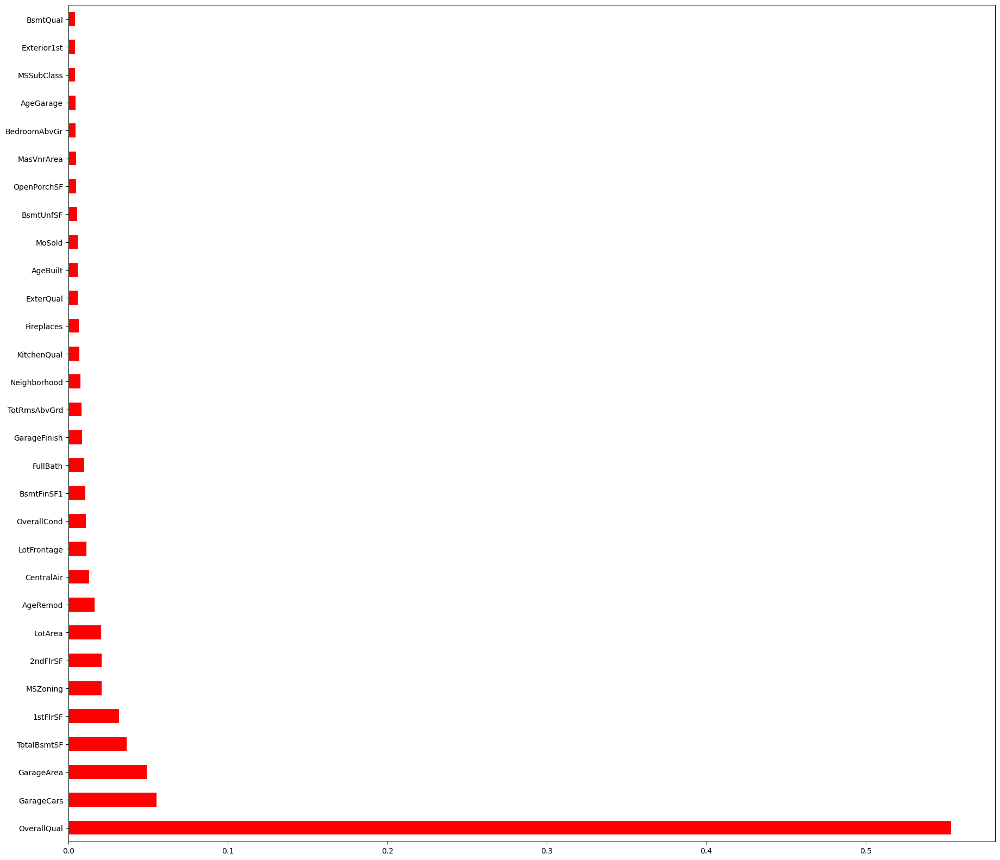

In [111]:
plt.figure(figsize=(22,20))
importances=pd.Series(RFR.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="r")
plt.show()

Creating new train test split

In [112]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# Regression ALgorithms

In [113]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

# Linear Regression

R2_score: 0.9135263037433131
MAE: 0.2216452694105555
MSE: 0.08934981486931971
RMSE: 0.29891439388112395
Cross Validation Score: 0.8650122915172936


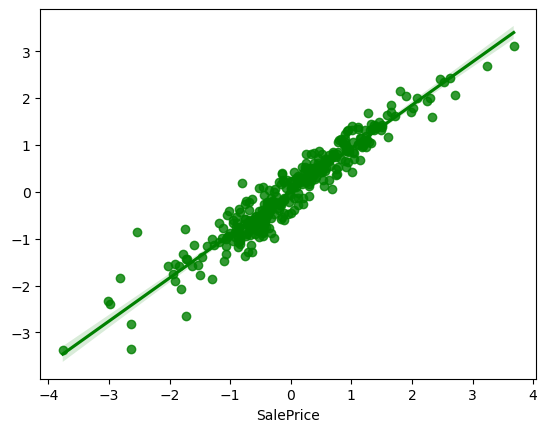

In [114]:
# checking r2 score for linear regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))

# mean Absolute error (MAE)
print('MAE:',metrics.mean_absolute_error(y_test, predLR))

# mean Squared error (MSE)
print('MSE:',metrics.mean_squared_error(y_test, predLR))

# root mean Squared error (RMSE)
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predLR)))

# checking cross validation score for Linear Regression
print("Cross Validation Score:",cross_val_score(LR,x,y,cv=5).mean())

# visualizing the predicted values
sns.regplot(y_test,predLR,color="g")
plt.show()

Created linear regression model and getting 91.35% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Regularization
Lasso Regressor

In [115]:
from sklearn.model_selection import GridSearchCV
# checking best alpha value
parameters={'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
lasso=Lasso()
clf=GridSearchCV(lasso,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.01}


R2_Score: -0.0006442632621941335
MAE: 0.7851151818514971
MSE: 1.0339257316713824
RMSE: 1.0168213863168802
Cross Validation Score: -0.01496753017094452


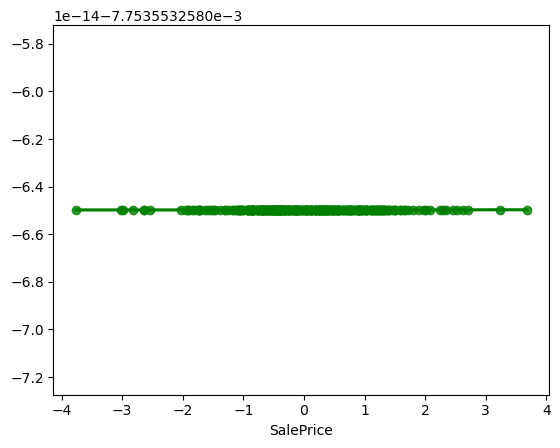

In [116]:
# checking r2score for Lasso Regressor
laso=Lasso(alpha=0.01)

# predictions
lasso.fit(x_train,y_train)
lasso.score(x_train,y_train)
pred_lasso=lasso.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_lasso))
print('MAE:',metrics.mean_absolute_error(y_test, pred_lasso))
print('MSE:',metrics.mean_squared_error(y_test, pred_lasso))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_lasso)))

# checking cv score for lasso regression
print("Cross Validation Score:",cross_val_score(lasso,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,pred_lasso,color="g")
plt.show()

# Ridge Regressor

In [117]:
# checking best alpha value
paramsRidge = {'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
ridge=Ridge()
clf=GridSearchCV(ridge,paramsRidge)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 55}


R2_Score: 0.9130979647161253
MAE: 0.22158072324242012
MSE: 0.08979240046976561
RMSE: 0.2996538010267275
Cross Validation Score: 0.8704185067085822


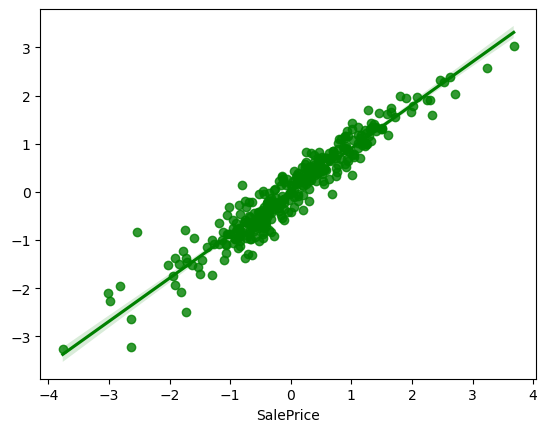

In [118]:
# checking r2score for Ridge Regressor
ridge=Ridge(alpha=100)

# predictions
ridge.fit(x_train,y_train)
ridge.score(x_train,y_train)
pred_ridge=ridge.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_ridge))
print('MAE:',metrics.mean_absolute_error(y_test, pred_ridge))
print('MSE:',metrics.mean_squared_error(y_test, pred_ridge))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_ridge)))

# checking cv score for Ridge regression
print("Cross Validation Score:",cross_val_score(ridge,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,pred_ridge,color="g")
plt.show()

# Ensemble Techniques
Random Forest Regressor

R2_Score: 0.8845883625531086
MAE: 0.24576219026857643
MSE: 0.11925023314644521
RMSE: 0.34532627057095616
Cross Validation Score: 0.8483481451849677


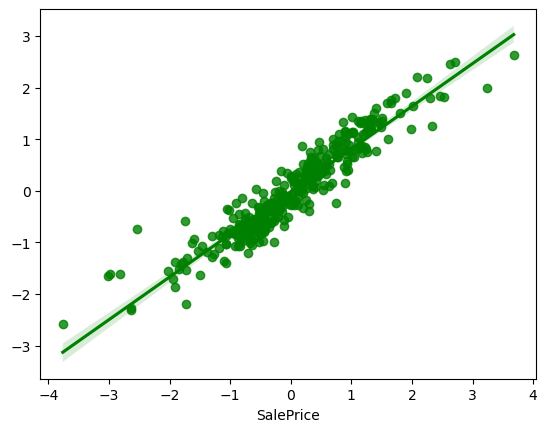

In [119]:
# checking r2score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# predictions
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))

# metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:',metrics.mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

# checking cv score for Random Forest regression
print("Cross Validation Score:",cross_val_score(RFR,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,predRFR,color="g")
plt.show()

# Extra Trees Regressor

R2_Score: 0.8638167393501557
MAE: 0.2605294427685053
MSE: 0.1407127213718816
RMSE: 0.37511694359476966
Cross Validation Score: 0.8509105116535858


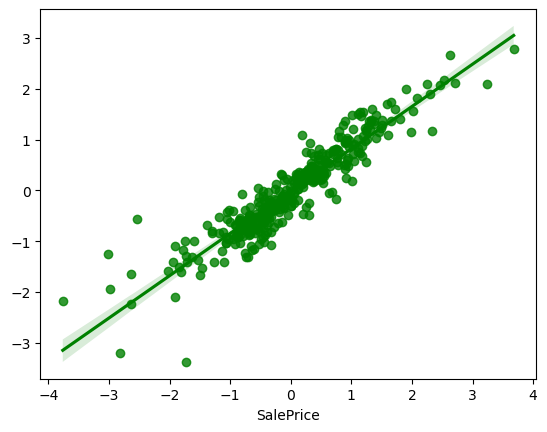

In [120]:
# checking r2score for Extra Trees Regressor
XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

# predictions
predXT=XT.predict(x_test)
print('R2_Score:',r2_score(y_test,predXT))

# metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXT))
print('MSE:',metrics.mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXT)))

# checking cv score for Extra Trees regression
print("Cross Validation Score:",cross_val_score(XT,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,predXT,color="g")
plt.show()

# Gradient Boosting Regressor

R2_Score: 0.8978665329332507
MAE: 0.2291275586480111
MSE: 0.10553043028584716
RMSE: 0.32485447555151087
Cross Validation Score: 0.865425111774061


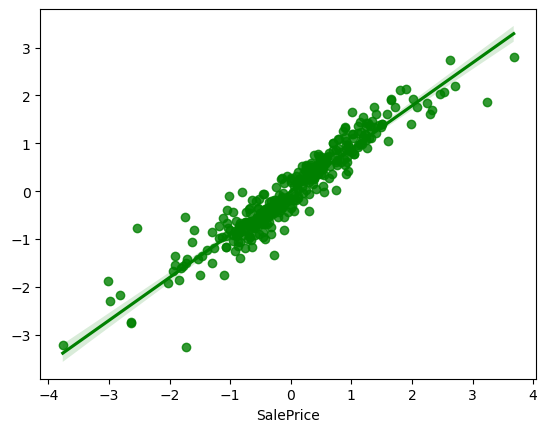

In [121]:
# checking r2score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# predictions
predGB=GB.predict(x_test)
print('R2_Score:',r2_score(y_test,predGB))

# metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:',metrics.mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predGB)))

# checking cv score for Gradient Boosting regression
print("Cross Validation Score:",cross_val_score(GB,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,predGB,color="g")
plt.show()

Created GradientBoosting Regressor model and getting 89.46% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Bagging Regressor

R2_Score: 0.8654142058258503
MAE: 0.2743320916310785
MSE: 0.13906212309700772
RMSE: 0.37291034190138483
Cross Validation Score: 0.8254032904688978


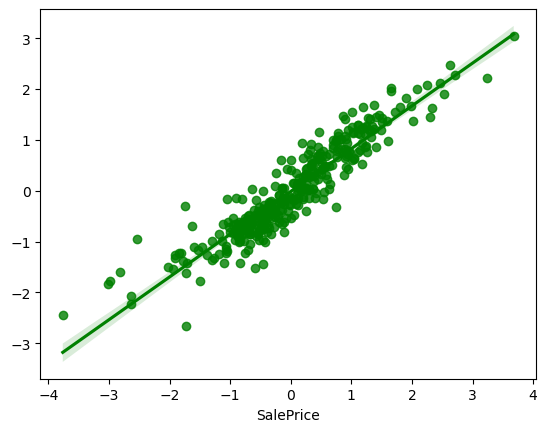

In [122]:
# checking r2score for Bagging Regressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# predictions
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))

# metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:',metrics.mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predBR)))

# checking cv score for Bagging regression
print("Cross Validation Score:",cross_val_score(BR,x,y,cv=5).mean())

# Visualizing the predicted values
sns.regplot(y_test,predBR,color="g")
plt.show()


Created Bagging Regressor model and getting 86.94% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Model Selection

# Difference between R2 score and Cross Validation Score

Linear Regressor = 4.85%
Lasso Regressor = 3.28%
Ridge Regressor = 4.26%
Random Forest Regressor = 3.46%
Extra Trees Regressor = 3.77%
Gradient Boosting Regressor = 2.97%
Bagging regressor = 1.75%
From the difference between R2 score and Cross validation score I can conclude that Bagging Regressor as my best fitting model as it is giving less difference compare to other models. Let's perform Hyperparameter tuning to increase the model accuracy.

# Hyper Parameter Tuning

In [123]:
# Let's use the GridSearchCV to find the best parameters in Bagging Regressor
from sklearn.model_selection import GridSearchCV

# Bagging Regressor
parameters = {'n_estimators': [10,50,100,200,500],
              'max_samples':[1.0,5.0,6.0,0.008],
              'max_features':[1.0,10.0,0.0001,5.68],
              'bootstrap':[True,False],
              'oob_score':[True,False],
              'n_jobs':[-1,-2,-3,-4]}

R2_Score:  88.86601193957557
Mean absolute error:  0.2444498726526816
Mean squared error:  0.11504304950757917
Root Mean Squared error: 0.33917996625328445


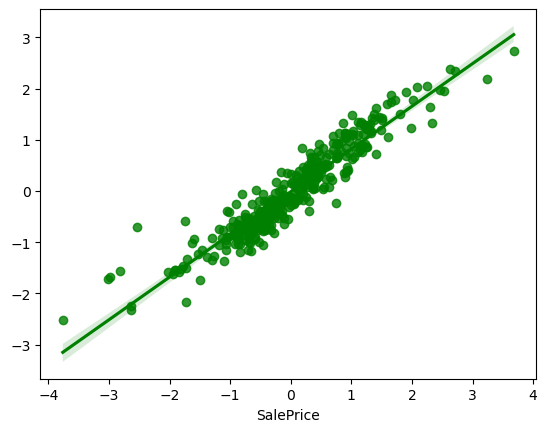

In [129]:
# creating final model
Final_Model = BaggingRegressor(bootstrap=True , max_features=1.0 , max_samples=1.0 , n_estimators=200 , n_jobs=-4 , oob_score=False )

# prediction
Final_Model.fit(x_train, y_train)
pred = Final_Model.predict(x_test)
print('R2_Score: ',r2_score(y_test,pred)*100)

# metric evaluation
print('Mean absolute error: ',metrics.mean_absolute_error(y_test, pred))
print('Mean squared error: ',metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared error:',np.sqrt(metrics.mean_squared_error(y_test, pred)))

# visualizing the predicted values
sns.regplot(y_test,pred,color="g")
plt.show()

# Saving the Final Model

In [130]:
# saving the model using .pkl
import joblib
joblib.dump(Final_Model,"Housing_Price_Prediction.pkl")


['Housing_Price_Prediction.pkl']

# Predicting the saved model

In [132]:
# loading the saved model
Model=joblib.load("Housing_Price_Prediction.pkl")

# prediction
prediction = Model.predict(x_test)
prediction

array([-5.81785756e-01, -7.55241610e-01, -1.71647330e+00,  1.78389610e-01,
       -4.57227205e-01,  3.81162654e-01, -7.80171150e-01, -7.76308376e-01,
       -9.37089287e-01, -1.44003293e-01, -5.38994277e-01, -1.91896209e-01,
       -1.79716165e-01,  1.34484394e+00, -7.67632135e-01, -3.91645041e-01,
        4.74691853e-02,  3.20758224e-02, -8.13506577e-01,  3.64323672e-01,
       -1.34206655e+00, -1.58386855e+00,  3.35324205e-01, -3.95050313e-01,
       -2.48533267e-01,  7.56142683e-01,  1.79783558e-01, -5.29390078e-01,
        1.05613677e+00,  5.06648839e-01, -1.18112088e-01,  3.19835112e-02,
       -1.40952822e-01, -6.18453738e-01,  1.77872064e+00,  3.45958392e-01,
        1.42255090e+00, -4.42050088e-01,  3.72621705e-02, -2.35268915e-01,
       -6.40075890e-01, -5.19312643e-02,  1.61379432e+00, -4.97929299e-01,
        5.30552182e-01, -4.27483886e-01,  1.49456408e+00,  1.68895566e+00,
        2.09732348e-01, -1.50594642e+00,  2.70207940e-01,  2.03712919e+00,
       -7.69018009e-01, -

# Creating DataFrame for the predicted values

In [133]:
pd.DataFrame([Model.predict(x_test)[:]],index=["Predicted","Original"])


,0,1,2,3,4,5,6,7,8,9,...,341,342,343,344,345,346,347,348,349,350
Predicted,-0.581786,-0.755242,-1.716473,0.17839,-0.457227,0.381163,-0.780171,-0.776308,-0.937089,-0.144003,...,-0.715264,-0.763505,-0.493508,-1.73474,-2.250364,0.157292,1.175485,-0.061951,-0.337708,-0.68302
Original,-0.581786,-0.755242,-1.716473,0.17839,-0.457227,0.381163,-0.780171,-0.776308,-0.937089,-0.144003,...,-0.715264,-0.763505,-0.493508,-1.73474,-2.250364,0.157292,1.175485,-0.061951,-0.337708,-0.68302


# The actual and predicted sales price are almost same.

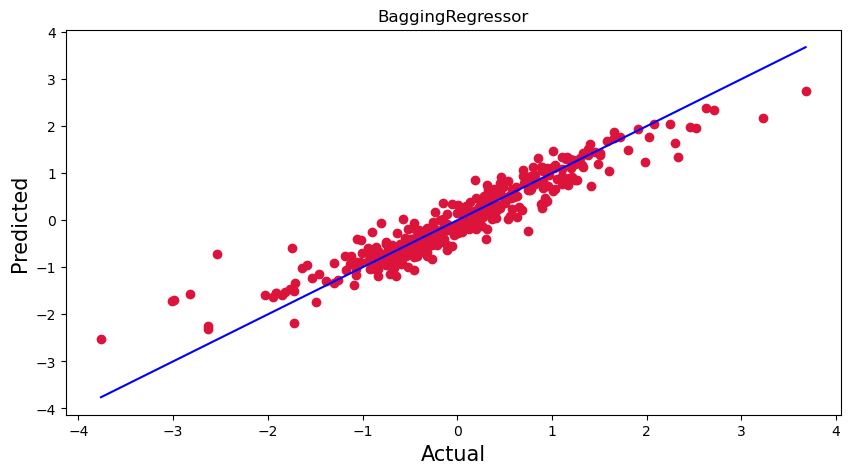

In [134]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("BaggingRegressor")
plt.show()

# Predicting SalePrice of house for test dataset using saved trained model

In [135]:
# predicting the house sale price from the features of the testing data
Predicted_SalePrice = Model.predict(x_test)
Predicted_SalePrice

array([-5.81785756e-01, -7.55241610e-01, -1.71647330e+00,  1.78389610e-01,
       -4.57227205e-01,  3.81162654e-01, -7.80171150e-01, -7.76308376e-01,
       -9.37089287e-01, -1.44003293e-01, -5.38994277e-01, -1.91896209e-01,
       -1.79716165e-01,  1.34484394e+00, -7.67632135e-01, -3.91645041e-01,
        4.74691853e-02,  3.20758224e-02, -8.13506577e-01,  3.64323672e-01,
       -1.34206655e+00, -1.58386855e+00,  3.35324205e-01, -3.95050313e-01,
       -2.48533267e-01,  7.56142683e-01,  1.79783558e-01, -5.29390078e-01,
        1.05613677e+00,  5.06648839e-01, -1.18112088e-01,  3.19835112e-02,
       -1.40952822e-01, -6.18453738e-01,  1.77872064e+00,  3.45958392e-01,
        1.42255090e+00, -4.42050088e-01,  3.72621705e-02, -2.35268915e-01,
       -6.40075890e-01, -5.19312643e-02,  1.61379432e+00, -4.97929299e-01,
        5.30552182e-01, -4.27483886e-01,  1.49456408e+00,  1.68895566e+00,
        2.09732348e-01, -1.50594642e+00,  2.70207940e-01,  2.03712919e+00,
       -7.69018009e-01, -

# Creating DataFrame and Saving the Predictions

In [136]:
# creating dataframe for the predicted results
Prediction = pd.DataFrame()
Prediction['SalePrice']= Predicted_SalePrice
Prediction

,SalePrice
0,-0.581786
1,-0.755242
2,-1.716473
3,0.178390
4,-0.457227
...,...
346,0.157292
347,1.175485
348,-0.061951
349,-0.337708


In [137]:
# saving the predictions
Prediction.to_csv("Predicted_House_Price_Data.csv", index=False)

# Conclusion:

  1)Overall quality is the most contributing and highest positive impacting feature. Also, the features like GarageArea, LotArea, 1stFlrSF, TotalBsmtSF etc have some what linear relation with the price variable.

   2)The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we have observed from the plot that as the overall quality of the house increases, the sale price also increases. That is there is good linear relation between SalePrice and OverallQual. So, if the seller builds the house according to these types of qualities that will increase the sale price of the house.

   3)There is a linear relation between the SalePrice and 1stFlrSF. As we have seen as the 1st floor area increases, sales price also increases moderately. So, people like to live in the houses which have only 1-2 floors and the cost of the house also increases in this case.

   4)Also, we have seen the positive linear relation between the SalePrice and GarageArea. As size of garage area increases, sale price also increases.

   5)There is positive linear relation between sale price had TotalBsmtSF. As total basement area increases, sale price also increases.

   6)Using the features which have some relation with target we have built many ML models also seen the increase in accuracy of the best model.